In [15]:
import numpy as np
import pymc as pm
import arviz as az
# -- use this line at the beginning of your notebook to turn on interactive plots
%matplotlib notebook
import scipy.io
# note these imports, thay may be useful in your own task

import matplotlib.pyplot as plt  # plotting library
import numpy as np  # work with numeric arrays without labeled axes
import xarray as xr  # work with arrays with labeled axes
import pandas as pd

In [16]:
file_path = 'LH_metal_DB_v1.12.csv'  # 替换为你的文件路径
df = pd.read_csv(file_path)
df.loc[:, 'TOK'] = df['TOK'].str.strip()
df['IP']=df['IP'].abs()/1000000
df['BT']=df['BT'].abs()
df['PLTH']=df['PLTH']/1000000
df['NEL']=df['NEL']/1e19


df.loc[:, 'TOK'] = df['TOK'].str.strip()

reference_dict = {
    1.00:  "Hydrogen",
    2.00:  "Deuterium",
    2.50:  "Deuterium and tritium",
    3.00:  "3He or tritium",
    4.00:  "4He",
    14.01: "Nitrogen"
}

# 定义一个函数，用来根据某一观测值PGASA，返回对应的分类名称
def categorize_pgasa(value, ref_dict, tolerance=0.2):
    """
    value: 待分类的数值
    ref_dict: {参考值: 分类名称}
    tolerance: 容忍度，即 |value - 参考值| 需小于等于该值才视为同一类
    """
    # 1) 找到离 value 最近的参考值
    closest_ref = min(ref_dict.keys(), key=lambda x: abs(x - value))
    # 2) 判断两者差值是否在容忍度以内
    if abs(closest_ref - value) <= tolerance:
        return ref_dict[closest_ref]
    else:
        return np.nan  # 或者 "Other"

# 将 categorize_pgasa 应用于 df["PGASA"] 列，生成新的分类列
df["Category"] = df["PGASA"].apply(lambda x: categorize_pgasa(x, reference_dict, tolerance=0.1))

# 如果需要查看分类结果
print(df)



      TOK        SHOT      TIME PHASE  PGASA      RGEO      AMIN    KAPPA  \
0    CMOD  1050428004   0.63461    LH  2.000  0.672389  0.216421  1.69737   
1    CMOD  1050428007   0.66603    LH  2.000  0.670773  0.217660  1.67073   
2    CMOD  1050621015   0.91039    LH  2.000  0.672785  0.217388  1.67962   
3    CMOD  1050621029   0.85420    LH  2.000  0.670869  0.217080  1.69789   
4    CMOD  1050623008   0.80070    LH  2.000  0.678764  0.213690  1.44202   
..    ...         ...       ...   ...    ...       ...       ...      ...   
685   JET       90527  50.99500    LH  1.962  2.900090  0.933780  1.66731   
686   JET       90528  55.16500    LH  1.916  2.901440  0.933319  1.66831   
687   JET       90737  54.56500    LH  1.940  2.901330  0.934255  1.66599   
688   JET       90738  54.46500    LH  1.961  2.898400  0.937640  1.65848   
689   JET       90742  52.16500    LH  1.983  2.900930  0.933565  1.66813   

       SPLASMA CONFIG  ...       PL     PLTH    PFLOSS PRADCORE    DIVCON  

In [17]:


# 假设 subset1 是你的数据框
colors = df['SELEC2024'].map({1: 'red', 0: 'blue'})
x = df['NEL']
y = df['PLTH']
bt = df['BT'].abs()
ip= df['IP']

# 分类 BT 值
subset2_2 = df[(ip < 2.6) & (ip >=2.4)&(bt < 3.2) & (bt >=2.8)& (df['Category'] == 'Deuterium')& (df['DIVCON'] == 'VT')]
df = df.drop(subset2_2.index)
print(df)

      TOK        SHOT      TIME PHASE  PGASA      RGEO      AMIN    KAPPA  \
0    CMOD  1050428004   0.63461    LH  2.000  0.672389  0.216421  1.69737   
1    CMOD  1050428007   0.66603    LH  2.000  0.670773  0.217660  1.67073   
2    CMOD  1050621015   0.91039    LH  2.000  0.672785  0.217388  1.67962   
3    CMOD  1050621029   0.85420    LH  2.000  0.670869  0.217080  1.69789   
4    CMOD  1050623008   0.80070    LH  2.000  0.678764  0.213690  1.44202   
..    ...         ...       ...   ...    ...       ...       ...      ...   
685   JET       90527  50.99500    LH  1.962  2.900090  0.933780  1.66731   
686   JET       90528  55.16500    LH  1.916  2.901440  0.933319  1.66831   
687   JET       90737  54.56500    LH  1.940  2.901330  0.934255  1.66599   
688   JET       90738  54.46500    LH  1.961  2.898400  0.937640  1.65848   
689   JET       90742  52.16500    LH  1.983  2.900930  0.933565  1.66813   

       SPLASMA CONFIG  ...       PL     PLTH    PFLOSS PRADCORE    DIVCON  

In [20]:
import statsmodels.api as sm

# 指定你想在新 DataFrame 中包含的列
columns_to_include = ['TOK', 'SPLASMA','BT','IP','RGEO','PLTH','NEL','PGASA',"DIVCON"]
new_df = df[df['SELEC2024'] == 1][columns_to_include].copy()
mu0 = 4 * np.pi * 1e-7

new_df['BP']=1000000*(mu0 * new_df['IP']) / (new_df['SPLASMA']/(2 * np.pi * new_df['RGEO']))

new_df['PLTH/S/2']=new_df['PLTH']/new_df['SPLASMA']/2
# 显示新 DataFrame
print("New DataFrame:")
print(new_df)


columns_to_include_for_regre = ['BP','BT','IP','PLTH/S/2','NEL','PGASA']
unique_divcon = new_df['DIVCON'].unique()

# 2. 向原始 DataFrame 添加新列
for divcon_type in unique_divcon:
    new_df[divcon_type] = (new_df['DIVCON'] == divcon_type).astype(int)
multi_df = new_df[columns_to_include_for_regre].copy()
multi_df = multi_df.apply(np.log)
x = multi_df[['BP','BT','IP','NEL','PGASA']] 
x[unique_divcon] = new_df[unique_divcon]
#x['Xp'] = x[['Xptref','Xpthigh','Xptin']].max(axis=1)
x.drop(['STANDARD'], axis=1, inplace=True)
#x.drop(['Xptref','Xpthigh','Xptin'], axis=1, inplace=True)
#x['hor'] = x[['V5E','V5C','V5L']].max(axis=1)
#x.drop(['V5E'], axis=1, inplace=True)
X_with_intercept = sm.add_constant(x)
y=multi_df["PLTH/S/2"]
model = sm.OLS(y, X_with_intercept)
results = model.fit()

# 打印详细统计结果
print(results.summary())

# 输出系数和标准误差
coefficients = results.params
std_errors = results.bse

labels = X_with_intercept.columns  # 获取变量名
for label, coef, std_err in zip(labels, coefficients, std_errors):
    print(f"{label}: {coef:.3f} ± {std_err:.3f}")

New DataFrame:
      TOK    SPLASMA       BT        IP      RGEO     PLTH    NEL  PGASA  \
0    CMOD    7.42158  5.33923  0.931812  0.672389  2.28952  19.70  2.000   
2    CMOD    7.37796  5.32586  0.634247  0.672785  1.42493  18.90  2.000   
3    CMOD    7.43647  5.33346  1.030660  0.670869  1.37273  16.20  2.000   
4    CMOD    6.70529  5.26510  0.681653  0.678764  1.79110  22.00  2.000   
5    CMOD    6.70899  5.26576  0.660100  0.678854  1.81159  21.50  2.000   
..    ...        ...      ...       ...       ...      ...    ...    ...   
679   JET  138.89300  2.94982  2.466400  2.900350  7.87774   3.65  1.922   
680   JET  138.67000  2.93182  3.154820  2.908120  7.33348   3.28  1.925   
683   JET  138.41700  2.95200  2.168050  2.898780  7.39600   3.22  1.915   
684   JET  138.57200  2.94335  2.806420  2.904780  9.08634   3.26  1.904   
686   JET  138.53000  3.31544  2.467660  2.901440  8.96516   3.37  1.916   

       DIVCON        BP  PLTH/S/2  
0     VERTPLT  0.666565  0.154247  


Sequential sampling (4 chains in 1 job)
CompoundStep
>NUTS: [alpha, p, eta, beta_ori, beta_m, pi, sigma2]
>CategoricalGibbsMetropolis: [S]
>BinaryGibbsMetropolis: [gamma]


Output()

Output()

Output()

Output()

Sampling 4 chains for 1_000 tune and 8_000 draw iterations (4_000 + 32_000 draws total) took 1125 seconds.
/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
There were 17142 divergences after tuning. Increase `target_accept` or reparameterize.
Chain 3 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


<IPython.core.display.Javascript object>


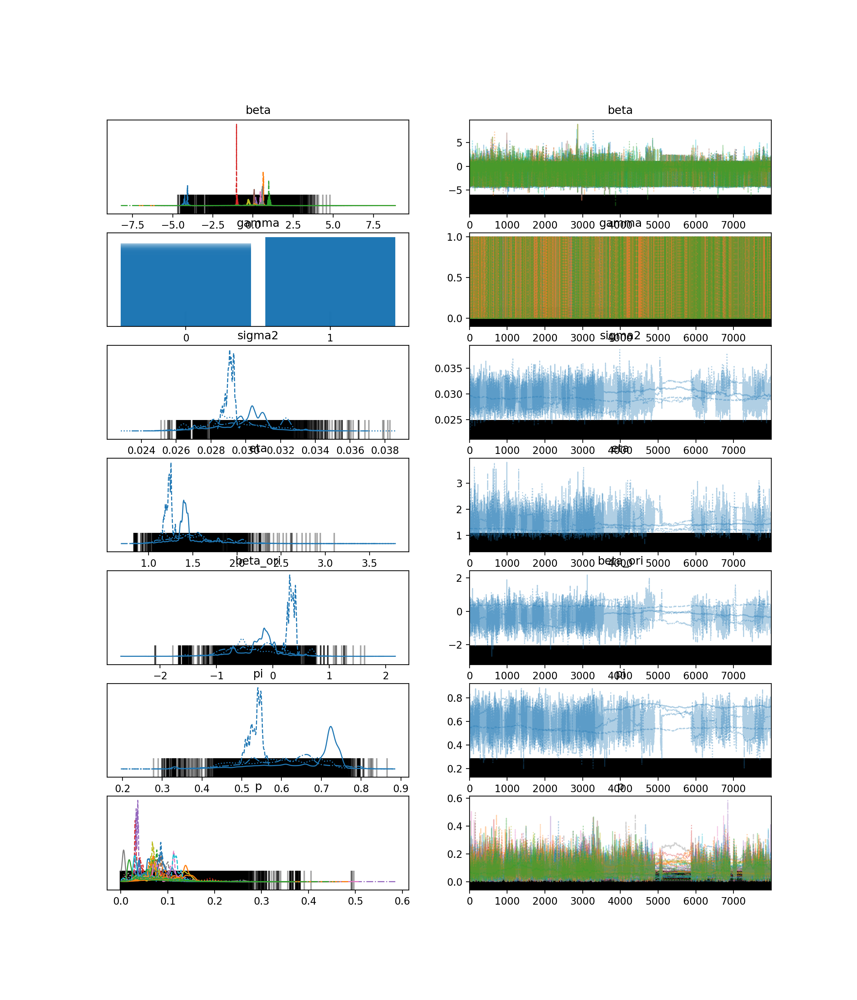

/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)


            mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
beta[0]   -4.171  0.122  -4.419   -3.988      0.029    0.021      26.0   
beta[1]    0.611  0.047   0.517    0.699      0.009    0.006      26.0   
beta[2]    1.003  0.050   0.914    1.100      0.007    0.005      54.0   
beta[3]   -1.001  0.032  -1.054   -0.937      0.006    0.004      33.0   
beta[4]    0.137  0.501   0.020    0.638      0.013    0.013     173.0   
beta[5]   -0.077  1.067  -2.551    1.729      0.015    0.025    4381.0   
beta[6]    0.480  0.040   0.414    0.563      0.008    0.006      29.0   
beta[7]    0.564  0.056   0.445    0.646      0.003    0.002     361.0   
beta[8]   -0.276  0.059  -0.384   -0.164      0.007    0.005      80.0   
beta[9]   -0.196  1.323  -4.160    1.142      0.020    0.041    2260.0   
beta[10]  -0.078  1.139  -2.548    2.431      0.014    0.017    4377.0   
beta[11]  -0.125  1.218  -4.096    1.103      0.015    0.023    6420.0   
beta[12]  -0.208  1.354  -4.190    1.1

In [78]:

# Step 1: Generate simulated data
np.random.seed(42)
N = 8000  # Number of samples
D = 13  # Number of predictors


# Step 2: Define the PyMC model
with pm.Model() as model:
    # Priors
    # Beta for regression coefficients, grouped into classes
    alpha = pm.HalfNormal("alpha", sigma=3.0)  # Dirichlet prior concentration parameter
    #alpha=5
    p = pm.Dirichlet("p", a=pm.math.ones(13) * alpha, shape=13)  # Class probabilities

    S = pm.Categorical("S", p=p, shape=D)  # Class assignment for predictors (0-9)

    eta = pm.InverseGamma("eta", alpha=8.0, beta=8.0)  # Variance for beta_m
    mu_0=pm.Normal("beta_ori",mu=0,sigma=1)
    beta_m = pm.Normal("beta_m", mu=mu_0, sigma=eta, shape=13)  # Regression coefficients for each class
    
    # Ensure S only indexes valid categories of beta_m
    beta = pm.Deterministic("beta", beta_m[S])  # Map beta based on S

    # Sparsity indicator gamma
    pi = pm.Beta("pi", alpha=8.0, beta=8.0)  # Probability of gamma=1
    gamma = pm.Bernoulli("gamma", p=pi, shape=D)

    # Noise variance (sigma^2)
    sigma2 = pm.InverseGamma("sigma2", alpha=1.0, beta=1)  # Prior for noise variance

    # Observed data likelihood
    mu = pm.math.dot(X_with_intercept, beta * gamma)  # Predicted mean
    y_obs = pm.Normal("y_obs", mu=mu, sigma=pm.math.sqrt(sigma2), observed=y)

    # Inference
    
    trace = pm.sample(N, tune=1000, chains=4,step=pm.NUTS(target_accept=0.90), return_inferencedata=True, cores=1)


# Step 3: Analyze and visualize the results
az.plot_trace(trace, var_names=["beta", "gamma", "sigma2", "eta", "beta_ori","pi", "p"])
plt.show()
summary=az.summary(trace, var_names=["beta", "gamma", "sigma2", "eta","beta_ori", "pi", "p"])
print(summary)

In [21]:
# 从后验中随机抽取 10 个样本
num_samples = 1000
posterior_indices = np.random.choice(
    trace.posterior["beta"].stack(samples=["chain", "draw"]).shape[1], 
    size=num_samples, 
    replace=False
)

# 定义新数据
 # 新数据 (10 个样本)

# 存储预测结果
beta_new_look = []
predictions = []
S_new = []
gamma_new=[]
for idx in posterior_indices:
    beta_sample = trace.posterior["beta"].stack(samples=["chain", "draw"]).values[:, idx]
    gamma_sample = trace.posterior["gamma"].stack(samples=["chain", "draw"]).values[:, idx]
    S_sample = trace.posterior["S"].stack(samples=["chain", "draw"]).values[:, idx]
    sigma_sample = np.sqrt(trace.posterior["sigma2"].stack(samples=["chain", "draw"]).values[idx])
    #gamma_binary = (gamma_post_mean > 0.5).astype(int)
    # 计算预测值
    mu_pred = X_with_intercept @ (beta_sample * gamma_sample)  # 预测均值
    y_pred = np.random.normal(mu_pred, sigma_sample, size=X_with_intercept.shape[0])  # 从预测分布采样
    S_new.append(gamma_sample*beta_sample)
    beta_new_look.append(S_sample)
    gamma_new.append(gamma_sample)
    predictions.append(y_pred)
S_new1 = np.array(S_new)
gamma_new = np.array(gamma_new)
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(12, 9))
axes = axes.flatten()

for i in range(13):
    ax = axes[i]
    # 只考虑 gamma 为 1 的情况
    #filtered_beta = S_new1[:, i][gamma_new[:, i] == 1]
    filtered_beta = S_new1[:, i]
    ax.hist(filtered_beta, bins=30, alpha=0.75, color='blue')
    ax.set_title(f'{X_with_intercept.columns[i]}')
    ax.set_xlabel('Value')
    ax.set_ylabel('Frequency')

plt.tight_layout()
plt.savefig('distribution.png', format='png', dpi=300, transparent=True)
plt.show()
S_mean_new = np.array(S_new).mean(axis=0)
beta_new_look_new = np.array(beta_new_look).mean(axis=0)
gamma_mean = np.array(gamma_new).mean(axis=0) 
gamma_binary = (gamma_mean > 0.5).astype(int)
print(gamma_mean)

predictions = np.array(predictions).T  
pred_mean = predictions.mean(axis=1) 
print(S_mean_new)
print(beta_new_look_new)
SS_res = np.sum((pred_mean - y) ** 2)
SS_tot = np.sum((y - np.mean(y)) ** 2)
R_squared = 1 - (SS_res / SS_tot)
print(f"1000 samples' R² values=: {R_squared:.4f}")
# 计算 RMSE
RMSE = np.sqrt(np.mean((pred_mean - y) ** 2))
print(f"1000 samples' RMSE values: {RMSE:.4f}")


ValueError: Dot product shape mismatch, (479, 17) vs (11,)

In [80]:

trace.to_netcdf("my_trace_new_for_D_STAND.nc")

# 查看并保存summary
summary_df = az.summary(trace, var_names=["beta", "gamma", "sigma2", "beta_ori","eta", "pi", "p"])
print(summary_df)
summary_df.to_csv("my_summary_new_for_D_STAND.csv")

/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)


            mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
beta[0]   -4.171  0.122  -4.419   -3.988      0.029    0.021      26.0   
beta[1]    0.611  0.047   0.517    0.699      0.009    0.006      26.0   
beta[2]    1.003  0.050   0.914    1.100      0.007    0.005      54.0   
beta[3]   -1.001  0.032  -1.054   -0.937      0.006    0.004      33.0   
beta[4]    0.137  0.501   0.020    0.638      0.013    0.013     173.0   
beta[5]   -0.077  1.067  -2.551    1.729      0.015    0.025    4381.0   
beta[6]    0.480  0.040   0.414    0.563      0.008    0.006      29.0   
beta[7]    0.564  0.056   0.445    0.646      0.003    0.002     361.0   
beta[8]   -0.276  0.059  -0.384   -0.164      0.007    0.005      80.0   
beta[9]   -0.196  1.323  -4.160    1.142      0.020    0.041    2260.0   
beta[10]  -0.078  1.139  -2.548    2.431      0.014    0.017    4377.0   
beta[11]  -0.125  1.218  -4.096    1.103      0.015    0.023    6420.0   
beta[12]  -0.208  1.354  -4.190    1.1

In [290]:
import statsmodels.api as sm

# 指定你想在新 DataFrame 中包含的列
columns_to_include = ['TOK', 'SPLASMA','BT','IP','RGEO','PLTH','NEL','PGASA',"DIVCON"]
new_df = df[df['SELEC2024'] == 1][columns_to_include].copy()
mu0 = 4 * np.pi * 1e-7

new_df['BP']=1000000*(mu0 * new_df['IP']) / (new_df['SPLASMA']/(2 * np.pi * new_df['RGEO']))

new_df['PLTH/S/2']=new_df['PLTH']/new_df['SPLASMA']/2
# 显示新 DataFrame
print("New DataFrame:")
print(new_df)


columns_to_include_for_regre = ['BP','PLTH/S/2','NEL','PGASA']
unique_divcon = new_df['DIVCON'].unique()

# 2. 向原始 DataFrame 添加新列
for divcon_type in unique_divcon:
    new_df[divcon_type] = (new_df['DIVCON'] == divcon_type).astype(int)
multi_df = new_df[columns_to_include_for_regre].copy()
multi_df = multi_df.apply(np.log)
x = multi_df[['BP','NEL','PGASA']] 
x[unique_divcon] = new_df[unique_divcon]
x['C/VT'] = x[['CORNER','VT']].max(axis=1)
x.drop(['VT','CORNER'], axis=1, inplace=True)
x.drop(['Xptref','Xpthigh','Xptin'], axis=1, inplace=True)
#x['hor'] = x[['V5E','V5C','V5L']].max(axis=1)
x.drop(['V5','V5E','V5C','HT3R','STANDARD'], axis=1, inplace=True)
X_with_intercept = sm.add_constant(x)
y=multi_df["PLTH/S/2"]
model = sm.OLS(y, X_with_intercept)
results = model.fit()

# 打印详细统计结果
print(results.summary())

# 输出系数和标准误差
coefficients = results.params
std_errors = results.bse

labels = X_with_intercept.columns  # 获取变量名
for label, coef, std_err in zip(labels, coefficients, std_errors):
    print(f"{label}: {coef:.3f} ± {std_err:.3f}")
# 打印 RMSE
y_pred = results.predict(X_with_intercept)  # 预测值
rmse = np.sqrt(np.mean((y - y_pred) ** 2))  # 计算 RMSE

print(f"RMSE: {rmse:.3f}")
# 获取 90% 置信区间
conf_int_90 = results.conf_int(alpha=0.1)


print("\n90% 置信区间：\n", conf_int_90)

New DataFrame:
      TOK    SPLASMA       BT        IP      RGEO     PLTH    NEL  PGASA  \
0    CMOD    7.42158  5.33923  0.931812  0.672389  2.28952  19.70  2.000   
2    CMOD    7.37796  5.32586  0.634247  0.672785  1.42493  18.90  2.000   
3    CMOD    7.43647  5.33346  1.030660  0.670869  1.37273  16.20  2.000   
4    CMOD    6.70529  5.26510  0.681653  0.678764  1.79110  22.00  2.000   
5    CMOD    6.70899  5.26576  0.660100  0.678854  1.81159  21.50  2.000   
..    ...        ...      ...       ...       ...      ...    ...    ...   
679   JET  138.89300  2.94982  2.466400  2.900350  7.87774   3.65  1.922   
680   JET  138.67000  2.93182  3.154820  2.908120  7.33348   3.28  1.925   
683   JET  138.41700  2.95200  2.168050  2.898780  7.39600   3.22  1.915   
684   JET  138.57200  2.94335  2.806420  2.904780  9.08634   3.26  1.904   
686   JET  138.53000  3.31544  2.467660  2.901440  8.96516   3.37  1.916   

       DIVCON        BP  PLTH/S/2  
0     VERTPLT  0.666565  0.154247  


Multiprocess sampling (4 chains in 4 jobs)
CompoundStep
>NUTS: [p, eta, beta_ori, beta_m, pi, sigma2]
>CategoricalGibbsMetropolis: [S]
>BinaryGibbsMetropolis: [gamma_prev, gamma]


Output()

Sampling 4 chains for 500 tune and 4_000 draw iterations (2_000 + 16_000 draws total) took 512 seconds.
/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
There were 8894 divergences after tuning. Increase `target_accept` or reparameterize.
Chain 2 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


<IPython.core.display.Javascript object>


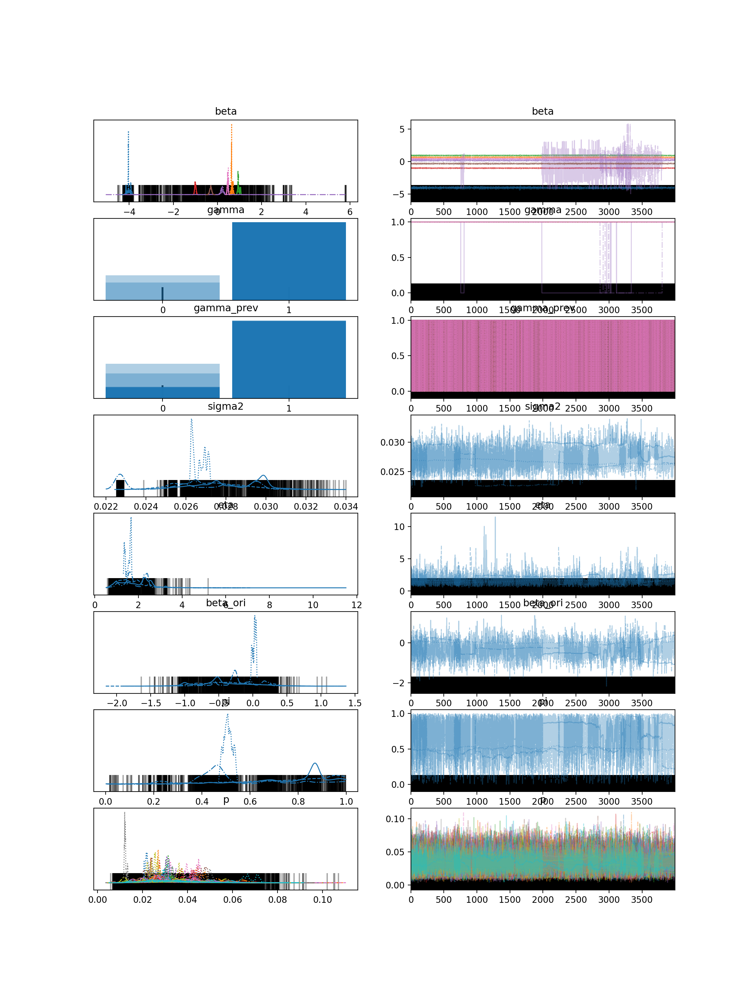

/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)


                mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
beta[0]       -4.021  0.076  -4.148   -3.874      0.018    0.013      18.0   
beta[1]        0.664  0.037   0.596    0.733      0.009    0.006      19.0   
beta[2]        0.953  0.041   0.894    1.054      0.012    0.008      16.0   
beta[3]       -1.002  0.030  -1.060   -0.946      0.002    0.001     260.0   
beta[4]        0.123  0.623  -1.011    1.025      0.073    0.072     193.0   
beta[5]       -0.307  0.047  -0.397   -0.219      0.002    0.002     377.0   
beta[6]        0.466  0.024   0.424    0.509      0.005    0.004      24.0   
gamma[0]       1.000  0.000   1.000    1.000      0.000    0.000   16000.0   
gamma[1]       1.000  0.000   1.000    1.000      0.000    0.000   16000.0   
gamma[2]       1.000  0.000   1.000    1.000      0.000    0.000   16000.0   
gamma[3]       1.000  0.000   1.000    1.000      0.000    0.000   16000.0   
gamma[4]       0.864  0.343   0.000    1.000      0.112    0.082

In [292]:

# Step 1: Generate simulated data
np.random.seed(42)
N = 4000  # Number of samples
D = 7  # Number of predictors


# Step 2: Define the PyMC model
with pm.Model() as model:
    # Priors
    # Beta for regression coefficients, grouped into classes
    #alpha = pm.HalfNormal("alpha", sigma=5.0)  # Dirichlet prior concentration parameter
    alpha=7
    p = pm.Dirichlet("p", a=pm.math.ones(30) * alpha, shape=30)  # Class probabilities
 #10 0 1 2 3 4 
    S = pm.Categorical("S", p=p, shape=7)# bp=nel shape  1 1 1  # Class assignment for predictors (0-9)
    #[1 3 5 7 9]
    eta = pm.InverseGamma("eta", alpha=3, beta=0.5)  # Variance for beta_m
    mu_0=pm.Normal("beta_ori",mu=0,sigma=1)
    beta_m = pm.Normal("beta_m", mu=mu_0, sigma=pm.math.sqrt(eta), shape=30)  # Regression coefficients for each class
    
    # Ensure S only indexes valid categories of beta_m
    beta = pm.Deterministic("beta", beta_m[S])  # Map beta based on S
    
    # Sparsity indicator gamma
    pi = pm.Beta("pi", alpha=1, beta=1)  # Probability of gamma=1
    gamma_prev = pm.Bernoulli("gamma_prev", p=0.5, shape=D)  # 初始值
    rho = 0.8  # 控制gamma的平稳性（越接近1越稳定）
    gamma = pm.Bernoulli("gamma", p=rho * gamma_prev + (1 - rho) * pi, shape=D)

    #gamma = pm.Bernoulli("gamma", p=pi, shape=D)

    # Noise variance (sigma^2)
    sigma2 = pm.InverseGamma("sigma2", alpha=5, beta=0.5)  # Prior for noise variance

    # Observed data likelihood
    mu = pm.math.dot(X_with_intercept, beta * gamma)  # Predicted mean
    y_obs = pm.Normal("y_obs", mu=mu, sigma=pm.math.sqrt(sigma2), observed=y)

    # Inference
    
    trace = pm.sample(N, tune=500, chains=4,step=pm.NUTS(target_accept=0.8), return_inferencedata=True)


# Step 3: Analyze and visualize the results
az.plot_trace(trace, var_names=["beta", "gamma", "gamma_prev","sigma2", "eta", "beta_ori","pi", "p"])
plt.show()
summary=az.summary(trace, var_names=["beta", "gamma","gamma_prev", "sigma2", "eta","beta_ori", "pi", "p"])
print(summary)

<IPython.core.display.Javascript object>


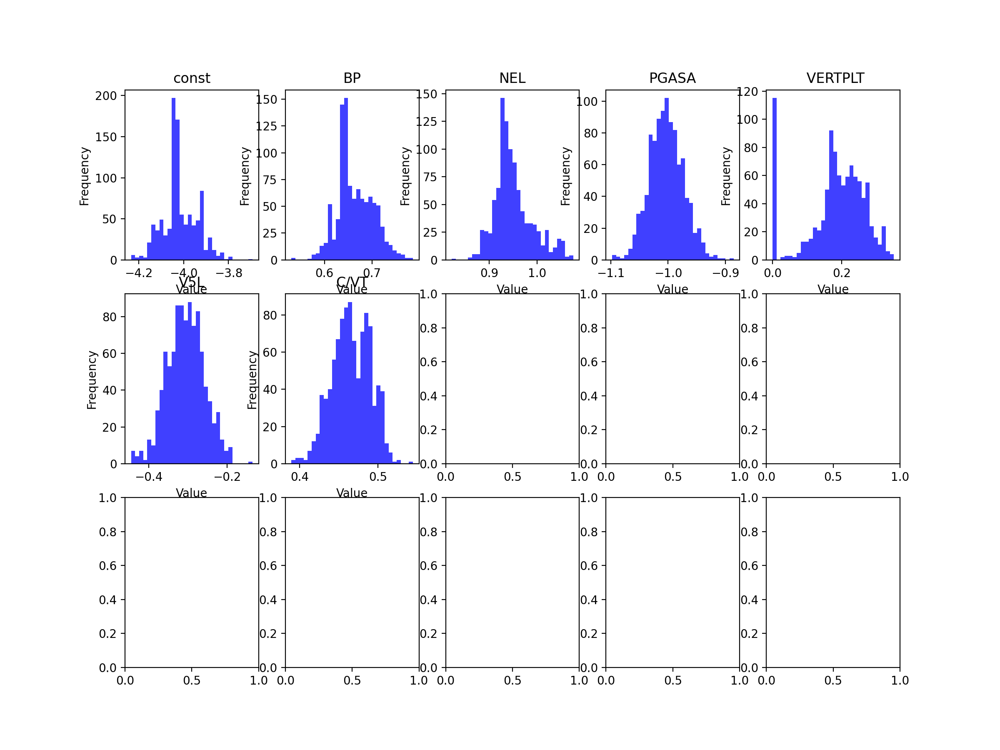

IndexError: index 7 is out of bounds for axis 1 with size 7

In [293]:
# 从后验中随机抽取 10 个样本
num_samples = 1000
posterior_indices = np.random.choice(
    trace.posterior["beta"].stack(samples=["chain", "draw"]).shape[1], 
    size=num_samples, 
    replace=False
)

# 定义新数据
 # 新数据 (10 个样本)

# 存储预测结果
beta_new_look = []
predictions = []
S_new = []
gamma_new=[]
for idx in posterior_indices:
    beta_sample = trace.posterior["beta"].stack(samples=["chain", "draw"]).values[:, idx]
    gamma_sample = trace.posterior["gamma"].stack(samples=["chain", "draw"]).values[:, idx]
    S_sample = trace.posterior["S"].stack(samples=["chain", "draw"]).values[:, idx]
    sigma_sample = np.sqrt(trace.posterior["sigma2"].stack(samples=["chain", "draw"]).values[idx])
    #gamma_binary = (gamma_post_mean > 0.5).astype(int)
    # 计算预测值
    mu_pred = X_with_intercept @ (beta_sample * gamma_sample)  # 预测均值
    y_pred = np.random.normal(mu_pred, sigma_sample, size=X_with_intercept.shape[0])  # 从预测分布采样
    S_new.append(gamma_sample*beta_sample)
    beta_new_look.append(S_sample)
    gamma_new.append(gamma_sample)
    predictions.append(y_pred)
S_new1 = np.array(S_new)
gamma_new = np.array(gamma_new)
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(12, 9))
axes = axes.flatten()

for i in range(8):
    ax = axes[i]
    # 只考虑 gamma 为 1 的情况
    #filtered_beta = S_new1[:, i][gamma_new[:, i] == 1]
    filtered_beta = S_new1[:, i]
    ax.hist(filtered_beta, bins=30, alpha=0.75, color='blue')
    ax.set_title(f'{X_with_intercept.columns[i]}')
    ax.set_xlabel('Value')
    ax.set_ylabel('Frequency')

plt.tight_layout()
plt.savefig('distribution.png', format='png', dpi=300, transparent=True)
plt.show()
S_mean_new = np.array(S_new).mean(axis=0)
beta_new_look_new = np.array(beta_new_look).mean(axis=0)
gamma_mean = np.array(gamma_new).mean(axis=0) 
gamma_binary = (gamma_mean > 0.5).astype(int)
print(gamma_mean)

predictions = np.array(predictions).T  
pred_mean = predictions.mean(axis=1) 
print(S_mean_new)
print(beta_new_look_new)
SS_res = np.sum((pred_mean - y) ** 2)
SS_tot = np.sum((y - np.mean(y)) ** 2)
R_squared = 1 - (SS_res / SS_tot)
print(f"1000 samples' R² values=: {R_squared:.4f}")
# 计算 RMSE
RMSE = np.sqrt(np.mean((pred_mean - y) ** 2))
print(f"1000 samples' RMSE values: {RMSE:.4f}")


In [84]:

trace.to_netcdf("my_trace_new_for_D_STAND_less_dimen.nc")

# 查看并保存summary
summary_df = az.summary(trace, var_names=["beta", "gamma", "sigma2", "beta_ori","eta", "pi", "p"])
print(summary_df)
summary_df.to_csv("my_summary_new_for_D_STAND_less_dimen.csv")

/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)


           mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
beta[0]  -4.123  0.112  -4.262   -3.911      0.034    0.025      10.0   
beta[1]   0.641  0.049   0.562    0.743      0.005    0.004     120.0   
beta[2]   1.007  0.066   0.909    1.097      0.025    0.019       7.0   
beta[3]  -1.000  0.032  -1.053   -0.936      0.006    0.005      27.0   
beta[4]  -0.093  1.002  -1.671    1.097      0.118    0.084     381.0   
beta[5]   0.463  0.024   0.414    0.509      0.003    0.002     117.0   
beta[6]   0.548  0.074   0.432    0.652      0.017    0.012      17.0   
beta[7]  -0.309  0.046  -0.389   -0.213      0.006    0.005      57.0   
gamma[0]  1.000  0.000   1.000    1.000      0.000    0.000   16000.0   
gamma[1]  1.000  0.000   1.000    1.000      0.000    0.000   16000.0   
gamma[2]  1.000  0.000   1.000    1.000      0.000    0.000   16000.0   
gamma[3]  1.000  0.000   1.000    1.000      0.000    0.000   16000.0   
gamma[4]  0.538  0.499   0.000    1.000      0.161 

Sequential sampling (4 chains in 1 job)
CompoundStep
>NUTS: [alpha, p, eta, beta_ori, beta_m, pi, sigma2]
>CategoricalGibbsMetropolis: [S]
>BinaryGibbsMetropolis: [gamma_prev, gamma]


Output()

Output()

Output()

Output()

Sampling 4 chains for 1_000 tune and 4_000 draw iterations (4_000 + 16_000 draws total) took 676 seconds.
/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
There were 2848 divergences after tuning. Increase `target_accept` or reparameterize.
Chain 3 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


<IPython.core.display.Javascript object>


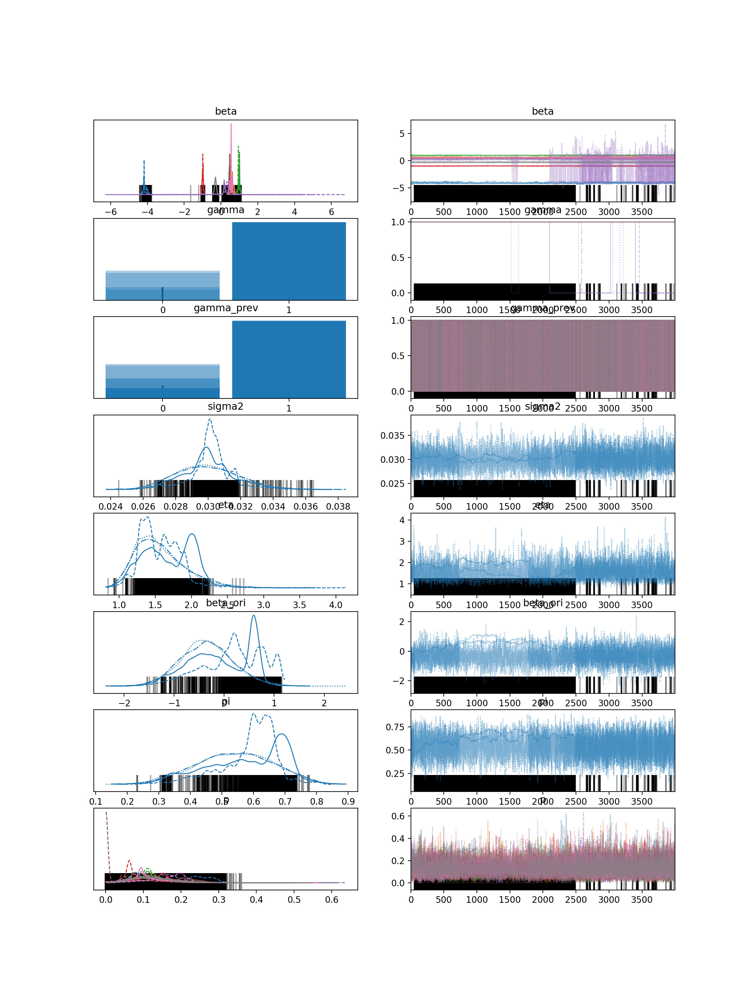

/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)


                mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
beta[0]       -4.110  0.102  -4.277   -3.908      0.017    0.012      38.0   
beta[1]        0.625  0.063   0.524    0.738      0.019    0.014      11.0   
beta[2]        0.976  0.053   0.875    1.081      0.013    0.009      16.0   
beta[3]       -0.990  0.033  -1.053   -0.926      0.003    0.002     151.0   
beta[4]        0.095  0.898  -1.042    1.077      0.070    0.077      97.0   
beta[5]        0.461  0.029   0.407    0.520      0.003    0.002     101.0   
beta[6]        0.537  0.066   0.428    0.643      0.006    0.004     162.0   
beta[7]       -0.298  0.050  -0.391   -0.205      0.001    0.001    2806.0   
gamma[0]       1.000  0.000   1.000    1.000      0.000    0.000   16000.0   
gamma[1]       1.000  0.000   1.000    1.000      0.000    0.000   16000.0   
gamma[2]       1.000  0.000   1.000    1.000      0.000    0.000   16000.0   
gamma[3]       1.000  0.000   1.000    1.000      0.000    0.000

In [85]:

# Step 1: Generate simulated data
np.random.seed(42)
N = 4000  # Number of samples
D = 8  # Number of predictors


# Step 2: Define the PyMC model
with pm.Model() as model:
    # Priors
    # Beta for regression coefficients, grouped into classes
    alpha = pm.HalfNormal("alpha", sigma=3.0)  # Dirichlet prior concentration parameter
    #alpha=5
    p = pm.Dirichlet("p", a=pm.math.ones(8) * alpha, shape=8)  # Class probabilities

    S = pm.Categorical("S", p=p, shape=D)  # Class assignment for predictors (0-9)

    eta = pm.InverseGamma("eta", alpha=8.0, beta=8.0)  # Variance for beta_m
    mu_0=pm.Normal("beta_ori",mu=0,sigma=1)
    beta_m = pm.Normal("beta_m", mu=mu_0, sigma=eta, shape=8)  # Regression coefficients for each class
    
    # Ensure S only indexes valid categories of beta_m
    beta = pm.Deterministic("beta", beta_m[S])  # Map beta based on S

    # Sparsity indicator gamma
    pi = pm.Beta("pi", alpha=8.0, beta=8.0)  # Probability of gamma=1
    gamma_prev = pm.Bernoulli("gamma_prev", p=0.5, shape=D)  # 初始值
    rho = 0.8  # 控制gamma的平稳性（越接近1越稳定）
    gamma = pm.Bernoulli("gamma", p=rho * gamma_prev + (1 - rho) * pi, shape=D)

    #gamma = pm.Bernoulli("gamma", p=pi, shape=D)

    # Noise variance (sigma^2)
    sigma2 = pm.InverseGamma("sigma2", alpha=1, beta=1)  # Prior for noise variance

    # Observed data likelihood
    mu = pm.math.dot(X_with_intercept, beta * gamma)  # Predicted mean
    y_obs = pm.Normal("y_obs", mu=mu, sigma=pm.math.sqrt(sigma2), observed=y)

    # Inference
    
    trace = pm.sample(N, tune=1000, chains=4,step=pm.NUTS(target_accept=0.95), return_inferencedata=True, cores=1)


# Step 3: Analyze and visualize the results
az.plot_trace(trace, var_names=["beta", "gamma", "gamma_prev","sigma2", "eta", "beta_ori","pi", "p"])
plt.show()
summary=az.summary(trace, var_names=["beta", "gamma","gamma_prev", "sigma2", "eta","beta_ori", "pi", "p"])
print(summary)

<IPython.core.display.Javascript object>


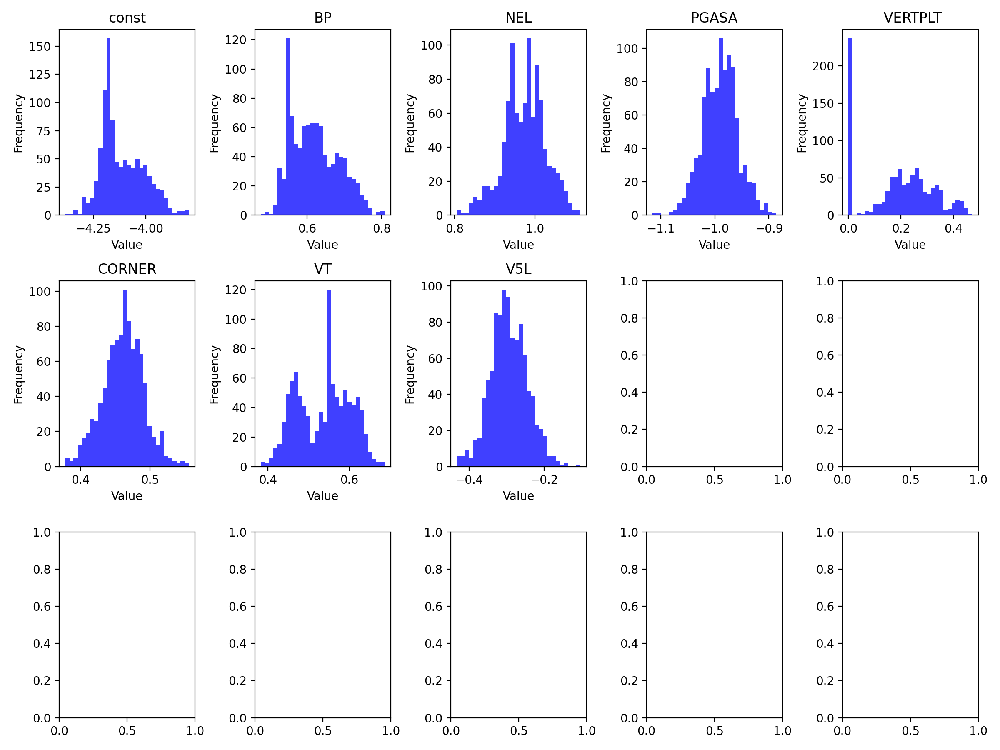

[1.    1.    1.    1.    0.763 1.    1.    1.   ]
[-4.11286443  0.62066498  0.97425649 -0.99033133  0.1924936   0.46164237
  0.53613808 -0.2935823 ]
[3.217 4.725 3.673 2.746 4.21  3.161 4.236 2.594]
1000 samples' R² values=: 0.9659
1000 samples' RMSE values: 0.1580


In [86]:
# 从后验中随机抽取 10 个样本
num_samples = 1000
posterior_indices = np.random.choice(
    trace.posterior["beta"].stack(samples=["chain", "draw"]).shape[1], 
    size=num_samples, 
    replace=False
)

# 定义新数据
 # 新数据 (10 个样本)

# 存储预测结果
beta_new_look = []
predictions = []
S_new = []
gamma_new=[]
for idx in posterior_indices:
    beta_sample = trace.posterior["beta"].stack(samples=["chain", "draw"]).values[:, idx]
    gamma_sample = trace.posterior["gamma"].stack(samples=["chain", "draw"]).values[:, idx]
    S_sample = trace.posterior["S"].stack(samples=["chain", "draw"]).values[:, idx]
    sigma_sample = np.sqrt(trace.posterior["sigma2"].stack(samples=["chain", "draw"]).values[idx])
    #gamma_binary = (gamma_post_mean > 0.5).astype(int)
    # 计算预测值
    mu_pred = X_with_intercept @ (beta_sample * gamma_sample)  # 预测均值
    y_pred = np.random.normal(mu_pred, sigma_sample, size=X_with_intercept.shape[0])  # 从预测分布采样
    S_new.append(gamma_sample*beta_sample)
    beta_new_look.append(S_sample)
    gamma_new.append(gamma_sample)
    predictions.append(y_pred)
S_new1 = np.array(S_new)
gamma_new = np.array(gamma_new)
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(12, 9))
axes = axes.flatten()

for i in range(8):
    ax = axes[i]
    # 只考虑 gamma 为 1 的情况
    #filtered_beta = S_new1[:, i][gamma_new[:, i] == 1]
    filtered_beta = S_new1[:, i]
    ax.hist(filtered_beta, bins=30, alpha=0.75, color='blue')
    ax.set_title(f'{X_with_intercept.columns[i]}')
    ax.set_xlabel('Value')
    ax.set_ylabel('Frequency')

plt.tight_layout()
plt.savefig('distribution.png', format='png', dpi=300, transparent=True)
plt.show()
S_mean_new = np.array(S_new).mean(axis=0)
beta_new_look_new = np.array(beta_new_look).mean(axis=0)
gamma_mean = np.array(gamma_new).mean(axis=0) 
gamma_binary = (gamma_mean > 0.5).astype(int)
print(gamma_mean)

predictions = np.array(predictions).T  
pred_mean = predictions.mean(axis=1) 
print(S_mean_new)
print(beta_new_look_new)
SS_res = np.sum((pred_mean - y) ** 2)
SS_tot = np.sum((y - np.mean(y)) ** 2)
R_squared = 1 - (SS_res / SS_tot)
print(f"1000 samples' R² values=: {R_squared:.4f}")
# 计算 RMSE
RMSE = np.sqrt(np.mean((pred_mean - y) ** 2))
print(f"1000 samples' RMSE values: {RMSE:.4f}")


In [87]:

trace.to_netcdf("my_trace_new_for_D_STAND_less_dimen_keep_gamma.nc")

# 查看并保存summary
summary_df = az.summary(trace, var_names=["beta", "gamma","gamma_prev", "sigma2", "beta_ori","eta", "pi", "p"])
print(summary_df)
summary_df.to_csv("my_summary_new_for_D_STAND_less_dimen_keep_gamma.csv")

/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)


                mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
beta[0]       -4.110  0.102  -4.277   -3.908      0.017    0.012      38.0   
beta[1]        0.625  0.063   0.524    0.738      0.019    0.014      11.0   
beta[2]        0.976  0.053   0.875    1.081      0.013    0.009      16.0   
beta[3]       -0.990  0.033  -1.053   -0.926      0.003    0.002     151.0   
beta[4]        0.095  0.898  -1.042    1.077      0.070    0.077      97.0   
beta[5]        0.461  0.029   0.407    0.520      0.003    0.002     101.0   
beta[6]        0.537  0.066   0.428    0.643      0.006    0.004     162.0   
beta[7]       -0.298  0.050  -0.391   -0.205      0.001    0.001    2806.0   
gamma[0]       1.000  0.000   1.000    1.000      0.000    0.000   16000.0   
gamma[1]       1.000  0.000   1.000    1.000      0.000    0.000   16000.0   
gamma[2]       1.000  0.000   1.000    1.000      0.000    0.000   16000.0   
gamma[3]       1.000  0.000   1.000    1.000      0.000    0.000

In [88]:
import statsmodels.api as sm

# 指定你想在新 DataFrame 中包含的列
columns_to_include = ['TOK', 'SPLASMA','BT','IP','RGEO','PLTH','NEL','PGASA',"DIVCON"]
new_df = df[df['SELEC2024'] == 1][columns_to_include].copy()
mu0 = 4 * np.pi * 1e-7

new_df['BP']=1000000*(mu0 * new_df['IP']) / (new_df['SPLASMA']/(2 * np.pi * new_df['RGEO']))

new_df['PLTH/S/2']=new_df['PLTH']/new_df['SPLASMA']/2
# 显示新 DataFrame
print("New DataFrame:")
print(new_df)


columns_to_include_for_regre = ['BP','PLTH/S/2','NEL','PGASA']
unique_divcon = new_df['DIVCON'].unique()

# 2. 向原始 DataFrame 添加新列
for divcon_type in unique_divcon:
    new_df[divcon_type] = (new_df['DIVCON'] == divcon_type).astype(int)
multi_df = new_df[columns_to_include_for_regre].copy()
multi_df = multi_df.apply(np.log)
x = multi_df[['BP','NEL','PGASA']] 
x[unique_divcon] = new_df[unique_divcon]
#x['Xp'] = x[['Xptref','Xpthigh','Xptin']].max(axis=1)
x.drop(['V5'], axis=1, inplace=True)
x.drop(['Xptref','Xpthigh','Xptin'], axis=1, inplace=True)
#x['hor'] = x[['V5E','V5C','HT3R']].max(axis=1)
x.drop(['HT3R','V5E','V5C','STANDARD'], axis=1, inplace=True)
X_with_intercept = sm.add_constant(x)
y=multi_df["PLTH/S/2"]
model = sm.OLS(y, X_with_intercept)
results = model.fit()

# 打印详细统计结果
print(results.summary())

# 输出系数和标准误差
coefficients = results.params
std_errors = results.bse

labels = X_with_intercept.columns  # 获取变量名
for label, coef, std_err in zip(labels, coefficients, std_errors):
    print(f"{label}: {coef:.3f} ± {std_err:.3f}")

New DataFrame:
      TOK    SPLASMA       BT        IP      RGEO     PLTH    NEL  PGASA  \
0    CMOD    7.42158  5.33923  0.931812  0.672389  2.28952  19.70  2.000   
2    CMOD    7.37796  5.32586  0.634247  0.672785  1.42493  18.90  2.000   
3    CMOD    7.43647  5.33346  1.030660  0.670869  1.37273  16.20  2.000   
4    CMOD    6.70529  5.26510  0.681653  0.678764  1.79110  22.00  2.000   
5    CMOD    6.70899  5.26576  0.660100  0.678854  1.81159  21.50  2.000   
..    ...        ...      ...       ...       ...      ...    ...    ...   
679   JET  138.89300  2.94982  2.466400  2.900350  7.87774   3.65  1.922   
680   JET  138.67000  2.93182  3.154820  2.908120  7.33348   3.28  1.925   
683   JET  138.41700  2.95200  2.168050  2.898780  7.39600   3.22  1.915   
684   JET  138.57200  2.94335  2.806420  2.904780  9.08634   3.26  1.904   
686   JET  138.53000  3.31544  2.467660  2.901440  8.96516   3.37  1.916   

       DIVCON        BP  PLTH/S/2  
0     VERTPLT  0.666565  0.154247  


Sequential sampling (4 chains in 1 job)
CompoundStep
>NUTS: [alpha, p, eta, beta_ori, beta_m, pi, sigma2]
>CategoricalGibbsMetropolis: [S]
>BinaryGibbsMetropolis: [gamma_prev, gamma]


Output()

Output()

Output()

Output()

Sampling 4 chains for 1_000 tune and 4_000 draw iterations (4_000 + 16_000 draws total) took 872 seconds.
/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
There were 1486 divergences after tuning. Increase `target_accept` or reparameterize.
Chain 0 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain 2 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


<IPython.core.display.Javascript object>


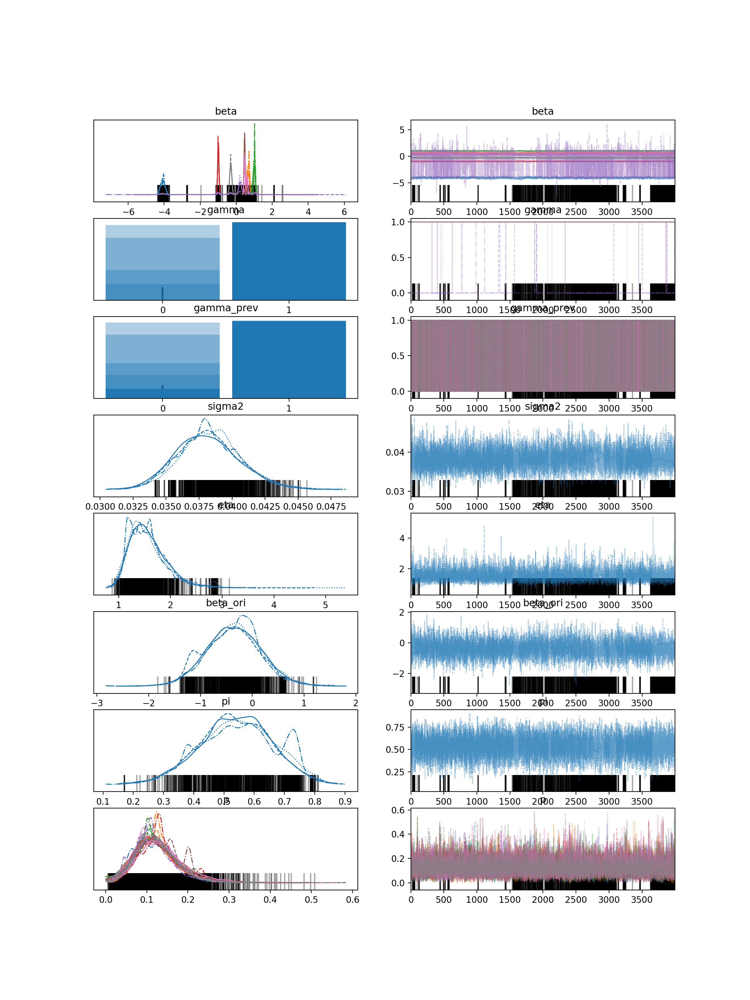

/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)


                mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
beta[0]       -4.079  0.118  -4.296   -3.865      0.005    0.003     588.0   
beta[1]        0.666  0.065   0.551    0.785      0.012    0.009      30.0   
beta[2]        0.998  0.055   0.890    1.093      0.014    0.010      17.0   
beta[3]       -0.996  0.038  -1.067   -0.924      0.001    0.001    1910.0   
beta[4]       -0.198  1.350  -4.072    1.085      0.079    0.092    7728.0   
beta[5]        0.463  0.032   0.404    0.523      0.001    0.001     625.0   
beta[6]        0.515  0.072   0.416    0.651      0.003    0.002     698.0   
beta[7]       -0.304  0.056  -0.410   -0.200      0.001    0.001    5687.0   
gamma[0]       1.000  0.000   1.000    1.000      0.000    0.000   16000.0   
gamma[1]       1.000  0.000   1.000    1.000      0.000    0.000   16000.0   
gamma[2]       1.000  0.000   1.000    1.000      0.000    0.000   16000.0   
gamma[3]       1.000  0.000   1.000    1.000      0.000    0.000

In [93]:

# Step 1: Generate simulated data
np.random.seed(42)
N = 4000  # Number of samples
D = 8  # Number of predictors


# Step 2: Define the PyMC model
with pm.Model() as model:
    # Priors
    # Beta for regression coefficients, grouped into classes
    alpha = pm.HalfNormal("alpha", sigma=5.0)  # Dirichlet prior concentration parameter
    #alpha=5
    p = pm.Dirichlet("p", a=pm.math.ones(8) * alpha, shape=8)  # Class probabilities

    S = pm.Categorical("S", p=p, shape=D)  # Class assignment for predictors (0-9)

    eta = pm.InverseGamma("eta", alpha=8.0, beta=8.0)  # Variance for beta_m
    mu_0=pm.Normal("beta_ori",mu=0,sigma=1)
    beta_m = pm.Normal("beta_m", mu=mu_0, sigma=eta, shape=8)  # Regression coefficients for each class
    
    # Ensure S only indexes valid categories of beta_m
    beta = pm.Deterministic("beta", beta_m[S])  # Map beta based on S

    # Sparsity indicator gamma
    pi = pm.Beta("pi", alpha=8.0, beta=8.0)  # Probability of gamma=1
    gamma_prev = pm.Bernoulli("gamma_prev", p=0.5, shape=D)  # 初始值
    rho = 0.8  # 控制gamma的平稳性（越接近1越稳定）
    gamma = pm.Bernoulli("gamma", p=rho * gamma_prev + (1 - rho) * pi, shape=D)

    #gamma = pm.Bernoulli("gamma", p=pi, shape=D)

    # Noise variance (sigma^2)
    sigma2 = pm.InverseGamma("sigma2", alpha=3, beta=3)  # Prior for noise variance

    # Observed data likelihood
    mu = pm.math.dot(X_with_intercept, beta * gamma)  # Predicted mean
    y_obs = pm.Normal("y_obs", mu=mu, sigma=pm.math.sqrt(sigma2), observed=y)

    # Inference
    
    trace = pm.sample(N, tune=1000, chains=4,step=pm.NUTS(target_accept=0.95), return_inferencedata=True, cores=1)


# Step 3: Analyze and visualize the results
az.plot_trace(trace, var_names=["beta", "gamma", "gamma_prev","sigma2", "eta", "beta_ori","pi", "p"])
plt.show()
summary=az.summary(trace, var_names=["beta", "gamma","gamma_prev", "sigma2", "eta","beta_ori", "pi", "p"])
print(summary)

<IPython.core.display.Javascript object>


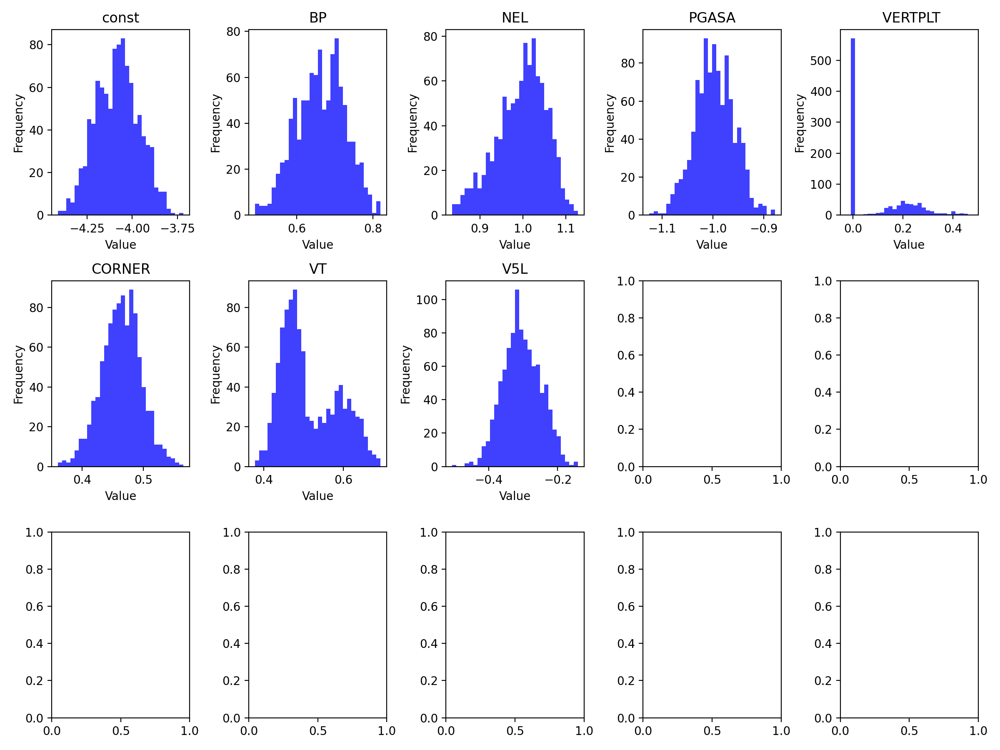

[1.    1.    1.    1.    0.429 1.    1.    1.   ]
[-4.08182858  0.66338196  0.99664023 -0.99649527  0.09942549  0.46386
  0.51426444 -0.30372716]
[2.92  4.074 5.766 3.013 3.167 3.329 3.54  3.306]
1000 samples' R² values=: 0.9657
1000 samples' RMSE values: 0.1584


In [94]:
# 从后验中随机抽取 10 个样本
num_samples = 1000
posterior_indices = np.random.choice(
    trace.posterior["beta"].stack(samples=["chain", "draw"]).shape[1], 
    size=num_samples, 
    replace=False
)

# 定义新数据
 # 新数据 (10 个样本)

# 存储预测结果
beta_new_look = []
predictions = []
S_new = []
gamma_new=[]
for idx in posterior_indices:
    beta_sample = trace.posterior["beta"].stack(samples=["chain", "draw"]).values[:, idx]
    gamma_sample = trace.posterior["gamma"].stack(samples=["chain", "draw"]).values[:, idx]
    S_sample = trace.posterior["S"].stack(samples=["chain", "draw"]).values[:, idx]
    sigma_sample = np.sqrt(trace.posterior["sigma2"].stack(samples=["chain", "draw"]).values[idx])
    #gamma_binary = (gamma_post_mean > 0.5).astype(int)
    # 计算预测值
    mu_pred = X_with_intercept @ (beta_sample * gamma_sample)  # 预测均值
    y_pred = np.random.normal(mu_pred, sigma_sample, size=X_with_intercept.shape[0])  # 从预测分布采样
    S_new.append(gamma_sample*beta_sample)
    beta_new_look.append(S_sample)
    gamma_new.append(gamma_sample)
    predictions.append(y_pred)
S_new1 = np.array(S_new)
gamma_new = np.array(gamma_new)
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(12, 9))
axes = axes.flatten()

for i in range(8):
    ax = axes[i]
    # 只考虑 gamma 为 1 的情况
    #filtered_beta = S_new1[:, i][gamma_new[:, i] == 1]
    filtered_beta = S_new1[:, i]
    ax.hist(filtered_beta, bins=30, alpha=0.75, color='blue')
    ax.set_title(f'{X_with_intercept.columns[i]}')
    ax.set_xlabel('Value')
    ax.set_ylabel('Frequency')

plt.tight_layout()
plt.savefig('distribution.png', format='png', dpi=300, transparent=True)
plt.show()
S_mean_new = np.array(S_new).mean(axis=0)
beta_new_look_new = np.array(beta_new_look).mean(axis=0)
gamma_mean = np.array(gamma_new).mean(axis=0) 
gamma_binary = (gamma_mean > 0.5).astype(int)
print(gamma_mean)

predictions = np.array(predictions).T  
pred_mean = predictions.mean(axis=1) 
print(S_mean_new)
print(beta_new_look_new)
SS_res = np.sum((pred_mean - y) ** 2)
SS_tot = np.sum((y - np.mean(y)) ** 2)
R_squared = 1 - (SS_res / SS_tot)
print(f"1000 samples' R² values=: {R_squared:.4f}")
# 计算 RMSE
RMSE = np.sqrt(np.mean((pred_mean - y) ** 2))
print(f"1000 samples' RMSE values: {RMSE:.4f}")


In [153]:
import statsmodels.api as sm

# 指定你想在新 DataFrame 中包含的列
columns_to_include = ['TOK', 'SPLASMA','BT','IP','RGEO','PLTH','NEL','PGASA',"DIVCON"]
new_df = df[df['SELEC2024'] == 1][columns_to_include].copy()
new_df = new_df[new_df['TOK'] == "AUG"]
mu0 = 4 * np.pi * 1e-7

new_df['BP']=1000000*(mu0 * new_df['IP']) / (new_df['SPLASMA']/(2 * np.pi * new_df['RGEO']))

new_df['PLTH/S/2']=new_df['PLTH']/new_df['SPLASMA']/2
# 显示新 DataFrame
print("New DataFrame:")
print(new_df)


columns_to_include_for_regre = ['BT','PLTH/S/2','NEL','PGASA']
unique_divcon = new_df['DIVCON'].unique()

# 2. 向原始 DataFrame 添加新列
for divcon_type in unique_divcon:
    new_df[divcon_type] = (new_df['DIVCON'] == divcon_type).astype(int)
multi_df = new_df[columns_to_include_for_regre].copy()
multi_df = multi_df.apply(np.log)
x = multi_df[['BT','NEL','PGASA']] 
x[unique_divcon] = new_df[unique_divcon]
#x['Xp'] = x[['Xptref','Xpthigh','Xptin']].max(axis=1)
#x.drop([' VERTPLT','V5'], axis=1, inplace=True)
x.drop(["STANDARD",'Xptref','Xpthigh','Xptin'], axis=1, inplace=True)
#x['hor'] = x[['V5E','V5C','HT3R']].max(axis=1)
#x.drop(['HT3R','V5E','V5C','STANDARD'], axis=1, inplace=True)
X_with_intercept = sm.add_constant(x)
y=multi_df["PLTH/S/2"]
model = sm.OLS(y, X_with_intercept)
results = model.fit()

# 打印详细统计结果
print(results.summary())

# 输出系数和标准误差
coefficients = results.params
std_errors = results.bse

labels = X_with_intercept.columns  # 获取变量名
for label, coef, std_err in zip(labels, coefficients, std_errors):
    print(f"{label}: {coef:.3f} ± {std_err:.3f}")

New DataFrame:
     TOK  SPLASMA     BT      IP   RGEO    PLTH   NEL  PGASA    DIVCON  \
77   AUG    44.56  2.883  1.0040  1.621  1.6600  4.50    2.0  STANDARD   
78   AUG    44.57  2.882  1.0030  1.619  1.6500  4.56    2.0  STANDARD   
79   AUG    44.70  2.883  0.9987  1.614  1.3000  4.77    2.0  STANDARD   
89   AUG    44.41  2.283  1.0000  1.634  1.5000  4.12    2.0  STANDARD   
90   AUG    44.40  2.284  0.9987  1.631  1.3000  4.04    2.0  STANDARD   
..   ...      ...    ...     ...    ...     ...   ...    ...       ...   
324  AUG    44.08  2.288  0.5993  1.621  0.8800  2.69    2.0  STANDARD   
325  AUG    43.98  2.482  0.7961  1.609  1.2500  4.79    2.0  STANDARD   
326  AUG    42.82  2.481  0.7967  1.623  1.1800  3.77    2.0  STANDARD   
327  AUG    42.89  2.976  0.7947  1.625  1.2310  3.70    2.0  STANDARD   
328  AUG    42.76  2.386  0.7952  1.626  0.9848  3.70    2.0  STANDARD   

           BP  PLTH/S/2  
77   0.288377  0.018627  
78   0.287670  0.018510  
79   0.284722  0.0

Sequential sampling (4 chains in 1 job)
CompoundStep
>NUTS: [alpha, p, eta, beta_ori, beta_m, pi, sigma2]
>CategoricalGibbsMetropolis: [S]
>BinaryGibbsMetropolis: [gamma_prev, gamma]


Output()

Output()

Output()

Output()

Sampling 4 chains for 1_000 tune and 5_000 draw iterations (4_000 + 20_000 draws total) took 383 seconds.
/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
There were 4576 divergences after tuning. Increase `target_accept` or reparameterize.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


<IPython.core.display.Javascript object>


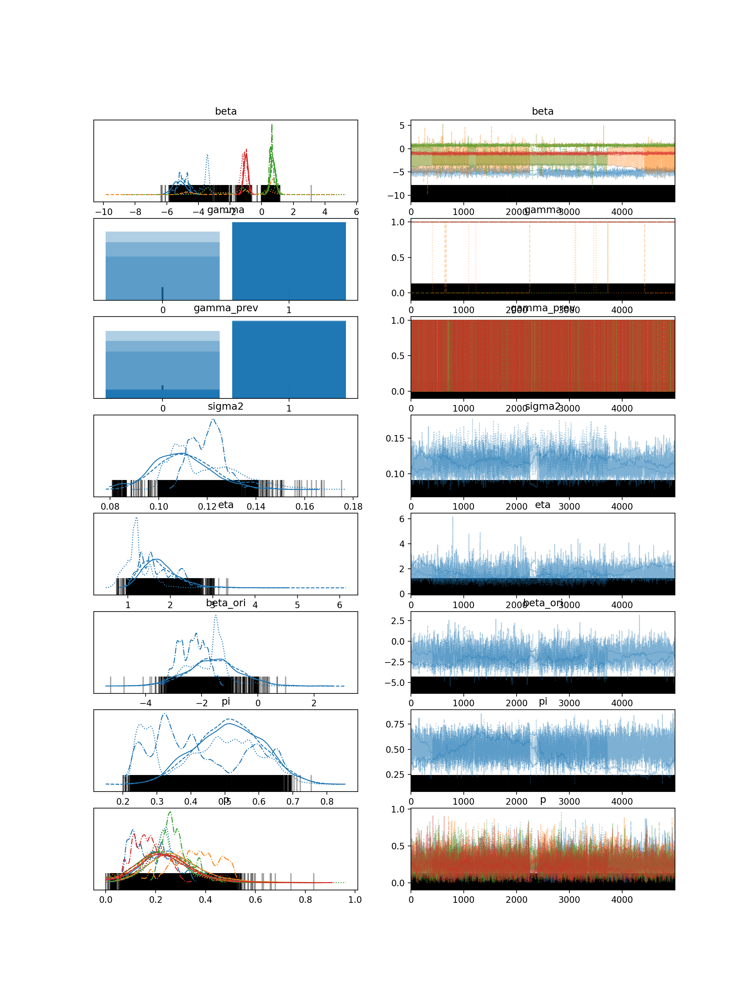

/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)


                mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
beta[0]       -4.698  0.720  -5.665   -3.289      0.311    0.233       7.0   
beta[1]       -0.290  1.673  -4.010    1.232      0.568    0.416      11.0   
beta[2]        0.144  1.269  -3.432    1.051      0.505    0.375       8.0   
beta[3]       -1.047  0.167  -1.373   -0.744      0.043    0.032      16.0   
gamma[0]       1.000  0.000   1.000    1.000      0.000    0.000   20000.0   
gamma[1]       0.640  0.480   0.000    1.000      0.210    0.157       5.0   
gamma[2]       0.814  0.389   0.000    1.000      0.173    0.130       5.0   
gamma[3]       1.000  0.000   1.000    1.000      0.000    0.000   20000.0   
gamma_prev[0]  0.909  0.288   0.000    1.000      0.002    0.002   14578.0   
gamma_prev[1]  0.614  0.487   0.000    1.000      0.170    0.125       8.0   
gamma_prev[2]  0.761  0.427   0.000    1.000      0.141    0.103       9.0   
gamma_prev[3]  0.902  0.298   0.000    1.000      0.002    0.002

In [155]:

# Step 1: Generate simulated data
np.random.seed(42)
N = 5000  # Number of samples
D = 4  # Number of predictors


# Step 2: Define the PyMC model
with pm.Model() as model:
    # Priors
    # Beta for regression coefficients, grouped into classes
    alpha = pm.HalfNormal("alpha", sigma=5.0)  # Dirichlet prior concentration parameter
    #alpha=5
    p = pm.Dirichlet("p", a=pm.math.ones(4) * alpha, shape=4)  # Class probabilities

    S = pm.Categorical("S", p=p, shape=D)  # Class assignment for predictors (0-9)

    eta = pm.InverseGamma("eta", alpha=12.0, beta=12.0)  # Variance for beta_m
    mu_0=pm.Normal("beta_ori",mu=0,sigma=1)
    beta_m = pm.Normal("beta_m", mu=mu_0, sigma=eta, shape=4)  # Regression coefficients for each class
    
    # Ensure S only indexes valid categories of beta_m
    beta = pm.Deterministic("beta", beta_m[S])  # Map beta based on S

    # Sparsity indicator gamma
    pi = pm.Beta("pi", alpha=12.0, beta=12.0)  # Probability of gamma=1
    gamma_prev = pm.Bernoulli("gamma_prev", p=0.5, shape=D)  # 初始值
    rho = 0.8  # 控制gamma的平稳性（越接近1越稳定）
    gamma = pm.Bernoulli("gamma", p=rho * gamma_prev + (1 - rho) * pi, shape=D)

    #gamma = pm.Bernoulli("gamma", p=pi, shape=D)

    # Noise variance (sigma^2)
    sigma2 = pm.InverseGamma("sigma2", alpha=2, beta=1)  # Prior for noise variance

    # Observed data likelihood
    mu = pm.math.dot(X_with_intercept, beta * gamma)  # Predicted mean
    y_obs = pm.Normal("y_obs", mu=mu, sigma=pm.math.sqrt(sigma2), observed=y)

    # Inference
    
    trace = pm.sample(N, tune=1000, chains=4,step=pm.NUTS(target_accept=0.9), return_inferencedata=True, cores=1)


# Step 3: Analyze and visualize the results
az.plot_trace(trace, var_names=["beta", "gamma", "gamma_prev","sigma2", "eta", "beta_ori","pi", "p"])
plt.show()
summary=az.summary(trace, var_names=["beta", "gamma","gamma_prev", "sigma2", "eta","beta_ori", "pi", "p"])
print(summary)

<IPython.core.display.Javascript object>


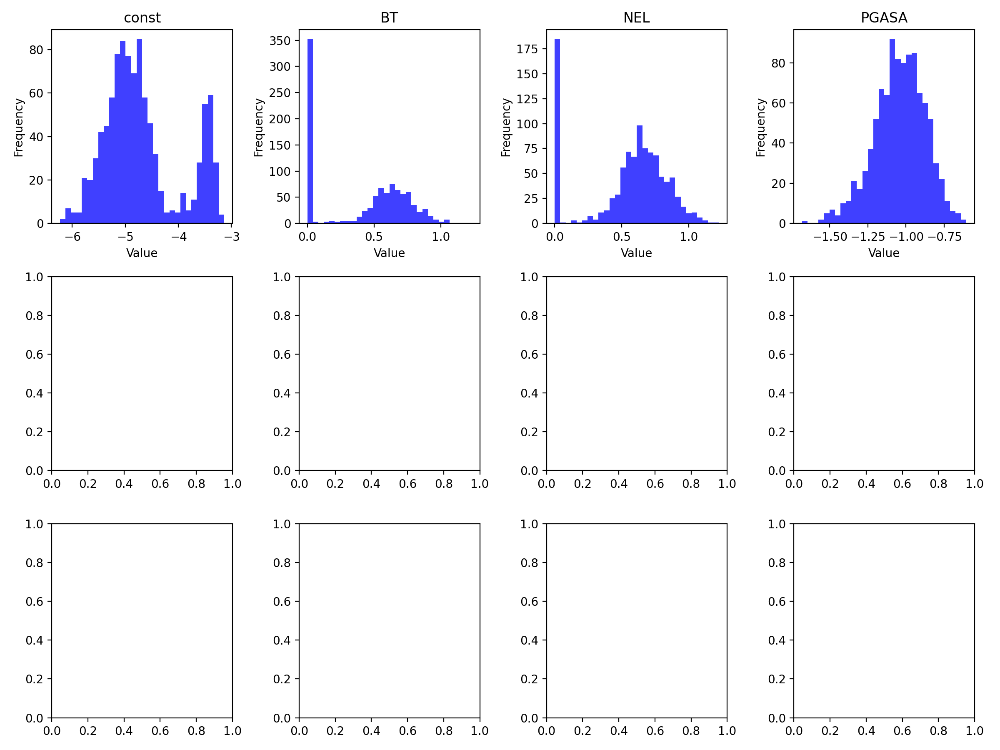

[1.    0.651 0.817 1.   ]
[-4.69941472  0.41605623  0.54831777 -1.04217393]
[1.888 1.15  0.87  1.102]
1000 samples' R² values=: 0.7865


In [156]:
# 从后验中随机抽取 10 个样本
num_samples = 1000
posterior_indices = np.random.choice(
    trace.posterior["beta"].stack(samples=["chain", "draw"]).shape[1], 
    size=num_samples, 
    replace=False
)

# 定义新数据
 # 新数据 (10 个样本)

# 存储预测结果
beta_new_look = []
predictions = []
S_new = []
gamma_new=[]
for idx in posterior_indices:
    beta_sample = trace.posterior["beta"].stack(samples=["chain", "draw"]).values[:, idx]
    gamma_sample = trace.posterior["gamma"].stack(samples=["chain", "draw"]).values[:, idx]
    S_sample = trace.posterior["S"].stack(samples=["chain", "draw"]).values[:, idx]
    sigma_sample = np.sqrt(trace.posterior["sigma2"].stack(samples=["chain", "draw"]).values[idx])
    #gamma_binary = (gamma_post_mean > 0.5).astype(int)
    # 计算预测值
    mu_pred = X_with_intercept @ (beta_sample * gamma_sample)  # 预测均值
    y_pred = np.random.normal(mu_pred, sigma_sample, size=X_with_intercept.shape[0])  # 从预测分布采样
    S_new.append(gamma_sample*beta_sample)
    beta_new_look.append(S_sample)
    gamma_new.append(gamma_sample)
    predictions.append(y_pred)
S_new1 = np.array(S_new)
gamma_new = np.array(gamma_new)
fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(12, 9))
axes = axes.flatten()

for i in range(4):
    ax = axes[i]
    # 只考虑 gamma 为 1 的情况
    #filtered_beta = S_new1[:, i][gamma_new[:, i] == 1]
    filtered_beta = S_new1[:, i]
    ax.hist(filtered_beta, bins=30, alpha=0.75, color='blue')
    ax.set_title(f'{X_with_intercept.columns[i]}')
    ax.set_xlabel('Value')
    ax.set_ylabel('Frequency')

plt.tight_layout()
plt.savefig('distribution.png', format='png', dpi=300, transparent=True)
plt.show()
S_mean_new = np.array(S_new).mean(axis=0)
beta_new_look_new = np.array(beta_new_look).mean(axis=0)
gamma_mean = np.array(gamma_new).mean(axis=0) 
gamma_binary = (gamma_mean > 0.5).astype(int)
print(gamma_mean)

predictions = np.array(predictions).T  
pred_mean = predictions.mean(axis=1) 
print(S_mean_new)
print(beta_new_look_new)
SS_res = np.sum((pred_mean - y) ** 2)
SS_tot = np.sum((y - np.mean(y)) ** 2)
R_squared = 1 - (SS_res / SS_tot)
print(f"1000 samples' R² values=: {R_squared:.4f}")

In [14]:
import statsmodels.api as sm

# 指定你想在新 DataFrame 中包含的列
columns_to_include = ['TOK', 'SPLASMA','BT','IP','RGEO','PLTH','NEL','PGASA',"DIVCON"]
new_df = df[df['SELEC2024'] == 1][columns_to_include].copy()
new_df = new_df[new_df['TOK'] == "JET"]
mu0 = 4 * np.pi * 1e-7

new_df['BP']=1000000*(mu0 * new_df['IP']) / (new_df['SPLASMA']/(2 * np.pi * new_df['RGEO']))

new_df['PLTH/S/2']=new_df['PLTH']/new_df['SPLASMA']/2
# 显示新 DataFrame
print("New DataFrame:")
print(new_df)


columns_to_include_for_regre = ['BP','PLTH/S/2','NEL','PGASA']
unique_divcon = new_df['DIVCON'].unique()

# 2. 向原始 DataFrame 添加新列
for divcon_type in unique_divcon:
    new_df[divcon_type] = (new_df['DIVCON'] == divcon_type).astype(int)
multi_df = new_df[columns_to_include_for_regre].copy()
multi_df = multi_df.apply(np.log)
x = multi_df[['BP','NEL','PGASA']] 
x[unique_divcon] = new_df[unique_divcon]
#x['Xp'] = x[['Xptref','Xpthigh','Xptin']].max(axis=1)
#x.drop([' VERTPLT','V5'], axis=1, inplace=True)
#x.drop(["STANDARD",'Xptref','Xpthigh','Xptin'], axis=1, inplace=True)
#x['hor'] = x[['V5E','V5C','HT3R']].max(axis=1)
#x.drop(['HT3R','V5E','V5C','STANDARD'], axis=1, inplace=True)
X_with_intercept = sm.add_constant(x)
y=multi_df["PLTH/S/2"]
model = sm.OLS(y, X_with_intercept)
results = model.fit()

# 打印详细统计结果
print(results.summary())

# 输出系数和标准误差
coefficients = results.params
std_errors = results.bse

labels = X_with_intercept.columns  # 获取变量名
for label, coef, std_err in zip(labels, coefficients, std_errors):
    print(f"{label}: {coef:.3f} ± {std_err:.3f}")
    
rmse = np.sqrt(np.mean((y - y_pred) ** 2))  # 计算 RMSE

print(f"RMSE: {rmse:.3f}")
# 获取 90% 置信区间
conf_int_90 = results.conf_int(alpha=0.1)

New DataFrame:
     TOK  SPLASMA       BT       IP     RGEO      PLTH   NEL  PGASA  DIVCON  \
329  JET  138.948  1.79605  1.64845  2.87944   1.51043  2.31  1.994      V5   
330  JET  141.637  3.68480  3.94234  2.87353  12.20250  5.26  1.918  CORNER   
331  JET  140.905  1.28971  1.35890  2.85668   1.87274  1.92  1.953  CORNER   
332  JET  141.642  1.91676  2.06529  2.86533   3.72168  2.40  1.917  CORNER   
333  JET  142.006  3.22555  3.44277  2.88515   9.03347  3.15  1.888  CORNER   
..   ...      ...      ...      ...      ...       ...   ...    ...     ...   
679  JET  138.893  2.94982  2.46640  2.90035   7.87774  3.65  1.922  CORNER   
680  JET  138.670  2.93182  3.15482  2.90812   7.33348  3.28  1.925  CORNER   
683  JET  138.417  2.95200  2.16805  2.89878   7.39600  3.22  1.915  CORNER   
684  JET  138.572  2.94335  2.80642  2.90478   9.08634  3.26  1.904  CORNER   
686  JET  138.530  3.31544  2.46766  2.90144   8.96516  3.37  1.916  CORNER   

           BP  PLTH/S/2  
329  0.269

Sequential sampling (4 chains in 1 job)
CompoundStep
>NUTS: [alpha, p, eta, beta_ori, beta_m, pi, sigma2]
>CategoricalGibbsMetropolis: [S]
>BinaryGibbsMetropolis: [gamma_prev, gamma]


Output()

Output()

Output()

Output()

Sampling 4 chains for 1_000 tune and 5_000 draw iterations (4_000 + 20_000 draws total) took 874 seconds.
/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
There were 6010 divergences after tuning. Increase `target_accept` or reparameterize.
Chain 3 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


<IPython.core.display.Javascript object>


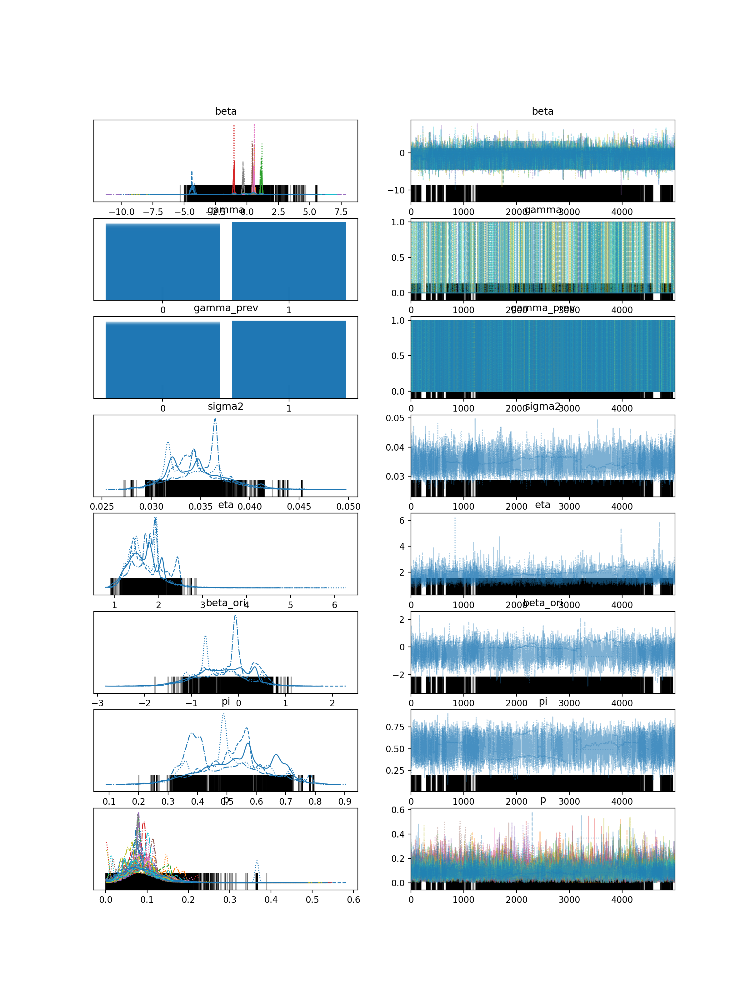

/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)


                 mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
beta[0]        -4.326  0.238  -4.602   -4.086      0.040    0.029      31.0   
beta[1]         0.549  0.064   0.434    0.667      0.010    0.007      43.0   
beta[2]         1.149  0.057   1.041    1.246      0.009    0.006      46.0   
beta[3]        -1.045  0.041  -1.126   -0.973      0.003    0.002     238.0   
beta[4]        -0.493  1.782  -4.478    1.651      0.024    0.017    3104.0   
beta[5]         0.428  0.193   0.384    0.522      0.029    0.021      57.0   
beta[6]         0.522  0.196   0.439    0.641      0.030    0.021     165.0   
beta[7]        -0.333  0.261  -0.422   -0.198      0.031    0.022     189.0   
beta[8]        -0.502  1.729  -4.556    1.311      0.019    0.014    3771.0   
beta[9]        -0.469  1.752  -4.587    1.434      0.020    0.014    3212.0   
beta[10]       -0.478  1.754  -4.594    1.405      0.020    0.014    2409.0   
gamma[0]        1.000  0.000   1.000    1.000      0

In [175]:

# Step 1: Generate simulated data
np.random.seed(42)
N = 5000  # Number of samples
D = 11  # Number of predictors


# Step 2: Define the PyMC model
with pm.Model() as model:
    # Priors
    # Beta for regression coefficients, grouped into classes
    alpha = pm.HalfNormal("alpha", sigma=5.0)  # Dirichlet prior concentration parameter
    #alpha=5
    p = pm.Dirichlet("p", a=pm.math.ones(11) * alpha, shape=11)  # Class probabilities

    S = pm.Categorical("S", p=p, shape=D)  # Class assignment for predictors (0-9)

    eta = pm.InverseGamma("eta", alpha=8.0, beta=8.0)  # Variance for beta_m
    mu_0=pm.Normal("beta_ori",mu=0,sigma=1)
    beta_m = pm.Normal("beta_m", mu=mu_0, sigma=eta, shape=11)  # Regression coefficients for each class
    
    # Ensure S only indexes valid categories of beta_m
    beta = pm.Deterministic("beta", beta_m[S])  # Map beta based on S

    # Sparsity indicator gamma
    pi = pm.Beta("pi", alpha=8.0, beta=8.0)  # Probability of gamma=1
    gamma_prev = pm.Bernoulli("gamma_prev", p=0.5, shape=D)  # 初始值
    rho = 0.8  # 控制gamma的平稳性（越接近1越稳定）
    gamma = pm.Bernoulli("gamma", p=rho * gamma_prev + (1 - rho) * pi, shape=D)

    #gamma = pm.Bernoulli("gamma", p=pi, shape=D)

    # Noise variance (sigma^2)
    sigma2 = pm.InverseGamma("sigma2", alpha=1, beta=1)  # Prior for noise variance

    # Observed data likelihood
    mu = pm.math.dot(X_with_intercept, beta * gamma)  # Predicted mean
    y_obs = pm.Normal("y_obs", mu=mu, sigma=pm.math.sqrt(sigma2), observed=y)

    # Inference
    
    trace = pm.sample(N, tune=1000, chains=4,step=pm.NUTS(target_accept=0.8), return_inferencedata=True, cores=1)


# Step 3: Analyze and visualize the results
az.plot_trace(trace, var_names=["beta", "gamma", "gamma_prev","sigma2", "eta", "beta_ori","pi", "p"])
plt.show()
summary=az.summary(trace, var_names=["beta", "gamma","gamma_prev", "sigma2", "eta","beta_ori", "pi", "p"])
print(summary)

<IPython.core.display.Javascript object>


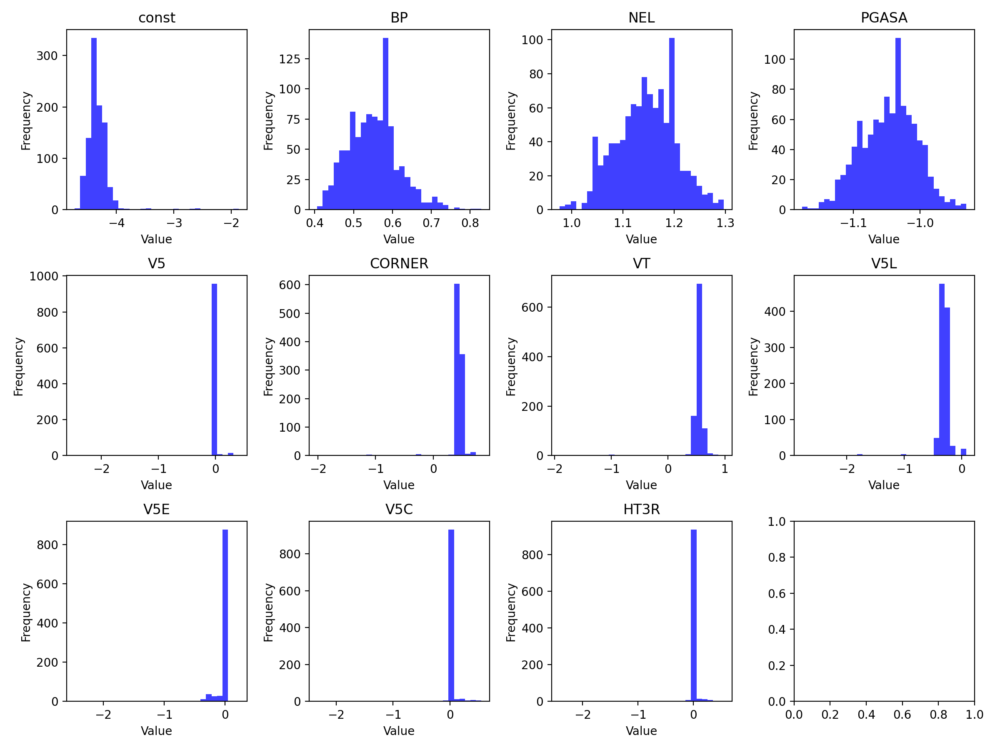

[1.    1.    1.    1.    0.051 1.    1.    0.982 0.128 0.082 0.076]
[-4.31886548  0.55247008  1.14568128 -1.04644844 -0.01899516  0.42686605
  0.52159999 -0.32346807 -0.04643769 -0.01212058 -0.01639137]
[3.033 4.777 4.461 3.189 4.82  5.069 4.743 5.262 5.033 4.873 4.938]
1000 samples' R² values=: 0.9094


In [10]:
# 从后验中随机抽取 10 个样本
num_samples = 1000
posterior_indices = np.random.choice(
    trace.posterior["beta"].stack(samples=["chain", "draw"]).shape[1], 
    size=num_samples, 
    replace=False
)

# 定义新数据
 # 新数据 (10 个样本)

# 存储预测结果
beta_new_look = []
predictions = []
S_new = []
gamma_new=[]
for idx in posterior_indices:
    beta_sample = trace.posterior["beta"].stack(samples=["chain", "draw"]).values[:, idx]
    gamma_sample = trace.posterior["gamma"].stack(samples=["chain", "draw"]).values[:, idx]
    S_sample = trace.posterior["S"].stack(samples=["chain", "draw"]).values[:, idx]
    sigma_sample = np.sqrt(trace.posterior["sigma2"].stack(samples=["chain", "draw"]).values[idx])
    #gamma_binary = (gamma_post_mean > 0.5).astype(int)
    # 计算预测值
    mu_pred = X_with_intercept @ (beta_sample * gamma_sample)  # 预测均值
    y_pred = np.random.normal(mu_pred, sigma_sample, size=X_with_intercept.shape[0])  # 从预测分布采样
    S_new.append(gamma_sample*beta_sample)
    beta_new_look.append(S_sample)
    gamma_new.append(gamma_sample)
    predictions.append(y_pred)
S_new1 = np.array(S_new)
gamma_new = np.array(gamma_new)
fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(12, 9))
axes = axes.flatten()

for i in range(11):
    ax = axes[i]
    # 只考虑 gamma 为 1 的情况
    #filtered_beta = S_new1[:, i][gamma_new[:, i] == 1]
    filtered_beta = S_new1[:, i]
    ax.hist(filtered_beta, bins=30, alpha=0.75, color='blue')
    ax.set_title(f'{X_with_intercept.columns[i]}')
    ax.set_xlabel('Value')
    ax.set_ylabel('Frequency')

plt.tight_layout()
plt.savefig('distribution.png', format='png', dpi=300, transparent=True)
plt.show()
S_mean_new = np.array(S_new).mean(axis=0)
beta_new_look_new = np.array(beta_new_look).mean(axis=0)
gamma_mean = np.array(gamma_new).mean(axis=0) 
gamma_binary = (gamma_mean > 0.5).astype(int)
print(gamma_mean)

predictions = np.array(predictions).T  
pred_mean = predictions.mean(axis=1) 
print(S_mean_new)
print(beta_new_look_new)
SS_res = np.sum((pred_mean - y) ** 2)
SS_tot = np.sum((y - np.mean(y)) ** 2)
R_squared = 1 - (SS_res / SS_tot)
print(f"1000 samples' R² values=: {R_squared:.4f}")

In [177]:

trace.to_netcdf("my_trace_new_for_D_STAND_less_dimen_JET.nc")

# 查看并保存summary
summary_df = az.summary(trace, var_names=["beta", "gamma","gamma_prev", "sigma2", "beta_ori","eta", "pi", "p"])
print(summary_df)
summary_df.to_csv("my_summary_new_for_D_STAND_less_dimen_JET.csv")

/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)


                 mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
beta[0]        -4.326  0.238  -4.602   -4.086      0.040    0.029      31.0   
beta[1]         0.549  0.064   0.434    0.667      0.010    0.007      43.0   
beta[2]         1.149  0.057   1.041    1.246      0.009    0.006      46.0   
beta[3]        -1.045  0.041  -1.126   -0.973      0.003    0.002     238.0   
beta[4]        -0.493  1.782  -4.478    1.651      0.024    0.017    3104.0   
beta[5]         0.428  0.193   0.384    0.522      0.029    0.021      57.0   
beta[6]         0.522  0.196   0.439    0.641      0.030    0.021     165.0   
beta[7]        -0.333  0.261  -0.422   -0.198      0.031    0.022     189.0   
beta[8]        -0.502  1.729  -4.556    1.311      0.019    0.014    3771.0   
beta[9]        -0.469  1.752  -4.587    1.434      0.020    0.014    3212.0   
beta[10]       -0.478  1.754  -4.594    1.405      0.020    0.014    2409.0   
gamma[0]        1.000  0.000   1.000    1.000      0

In [9]:
import arviz as az
import numpy as np
import matplotlib.pyplot as plt

# 读取 MCMC 采样数据
trace = az.from_netcdf("my_trace_new_for_D_STAND_less_dimen_JET.nc")

# 查看 trace 中的变量
print(trace.posterior)


<xarray.Dataset> Size: 11MB
Dimensions:           (chain: 4, draw: 5000, S_dim_0: 11, beta_m_dim_0: 11,
                       gamma_prev_dim_0: 11, gamma_dim_0: 11, p_dim_0: 11,
                       beta_dim_0: 11)
Coordinates:
  * chain             (chain) int64 32B 0 1 2 3
  * draw              (draw) int64 40kB 0 1 2 3 4 5 ... 4995 4996 4997 4998 4999
  * S_dim_0           (S_dim_0) int64 88B 0 1 2 3 4 5 6 7 8 9 10
  * beta_m_dim_0      (beta_m_dim_0) int64 88B 0 1 2 3 4 5 6 7 8 9 10
  * gamma_prev_dim_0  (gamma_prev_dim_0) int64 88B 0 1 2 3 4 5 6 7 8 9 10
  * gamma_dim_0       (gamma_dim_0) int64 88B 0 1 2 3 4 5 6 7 8 9 10
  * p_dim_0           (p_dim_0) int64 88B 0 1 2 3 4 5 6 7 8 9 10
  * beta_dim_0        (beta_dim_0) int64 88B 0 1 2 3 4 5 6 7 8 9 10
Data variables:
    S                 (chain, draw, S_dim_0) int64 2MB ...
    beta_ori          (chain, draw) float64 160kB ...
    beta_m            (chain, draw, beta_m_dim_0) float64 2MB ...
    gamma_prev        (chain, draw

<IPython.core.display.Javascript object>


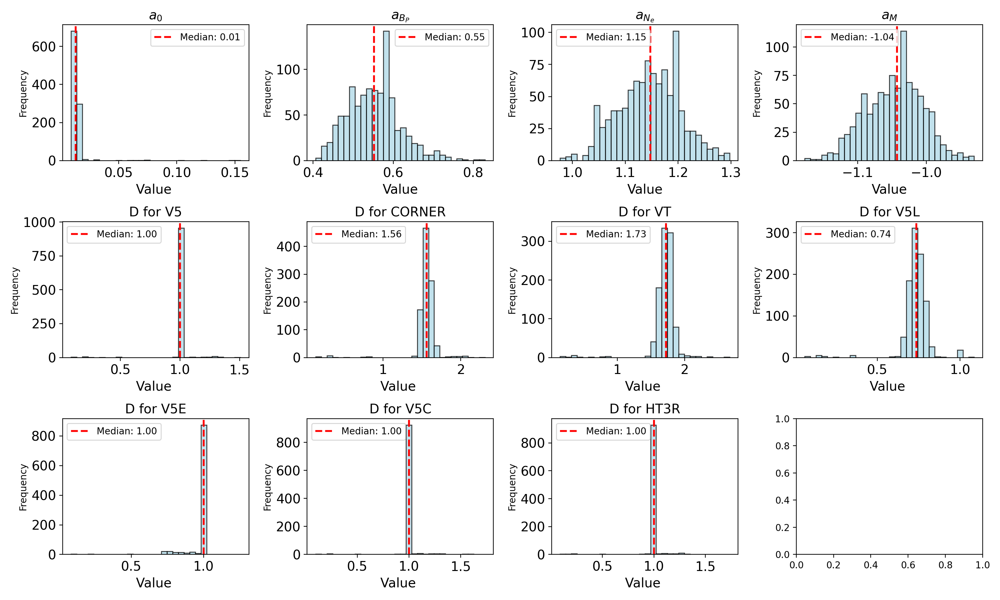

[1.    1.    1.    1.    0.051 1.    1.    0.982 0.128 0.082 0.076]
[-4.31886548  0.55247008  1.14568128 -1.04644844 -0.01899516  0.42686605
  0.52159999 -0.32346807 -0.04643769 -0.01212058 -0.01639137]
[3.033 4.777 4.461 3.189 4.82  5.069 4.743 5.262 5.033 4.873 4.938]
(262,)
1000 samples' RMSE: 0.1614


In [13]:
import numpy as np
import matplotlib.pyplot as plt
titles = ["$a_0$", "$a_{B_P}$", "$a_{N_e}$", "$a_{M}$", "D for V5", "D for CORNER", "D for VT", "D for V5L", "D for V5E", "D for V5C", "D for HT3R"]
S_new1 = np.array(S_new)  # 转换为 NumPy 数组
gamma_new = np.array(gamma_new)
D=11
# 绘制直方图
fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(15, 9))
axes = axes.flatten()

for i in range(D):
    ax = axes[i]

    # 只有第一张 (i=0) 和最后一张 (i=D-1) 需要 exp 变换
    if i == 0 or i in [4, 5,6,7,8,9,10]:

        filtered_beta = np.exp(S_new1[:, i])  # 只对特定索引应用 exp
        xlabel_text = 'Value '
    else:
        filtered_beta = S_new1[:, i]
        xlabel_text = 'Value'

    # 计算中位数
    median_value = np.median(filtered_beta)

    # 绘制直方图（颜色设为浅蓝）
    ax.hist(filtered_beta, bins=30, alpha=0.75, color='lightblue', edgecolor='black')

    # 标出中位数
    ax.axvline(median_value, color='red', linestyle='dashed', linewidth=2, label=f'Median: {median_value:.2f}')
    ax.legend()
    
    # 设置标题和标签
    #ax.set_title(f'{X_with_intercept.columns[i]}')
    ax.set_title(titles[i], fontsize=14)
    ax.set_xlabel(xlabel_text, fontsize=14)
    ax.tick_params(axis='both', which='major', labelsize=14)
    ax.set_ylabel('Frequency')

plt.tight_layout()
plt.savefig('distribution_exp_onlyJET_config_median.png', format='png', dpi=300, transparent=True)
plt.show()

# 计算均值
S_mean_new = S_new1.mean(axis=0)
beta_new_look_new = np.array(beta_new_look).mean(axis=0)  
gamma_mean = np.array(gamma_new).mean(axis=0) 
gamma_binary = (gamma_mean > 0.5).astype(int)

print(gamma_mean)
print(S_mean_new)
print(beta_new_look_new)

#predictions = np.array(predictions).T  
#pred_mean = predictions.mean(axis=1) 
'''SS_res = np.sum((pred_mean - y) ** 2)
SS_tot = np.sum((y - np.mean(y)) ** 2)
R_squared = 1 - (SS_res / SS_tot)

print(f"1000 samples' R² values=: {R_squared:.4f}")'''
from sklearn.metrics import mean_squared_error
pred_mean = predictions.mean(axis=1)  # 在采样维度上取均值，使得 pred_mean 变为 (483,)
print(pred_mean.shape)
rmse = np.sqrt(mean_squared_error(y, pred_mean))
print(f"1000 samples' RMSE: {rmse:.4f}")

In [267]:
import statsmodels.api as sm

# 指定你想在新 DataFrame 中包含的列
columns_to_include = ['TOK', 'SPLASMA','BT','IP','RGEO','PLTH','NEL','PGASA',"DIVCON"]
new_df = df[df['SELEC2024'] == 1][columns_to_include].copy()
new_df = new_df[new_df['TOK'] == "CMOD"]
mu0 = 4 * np.pi * 1e-7

new_df['BP']=1000000*(mu0 * new_df['IP']) / (new_df['SPLASMA']/(2 * np.pi * new_df['RGEO']))

new_df['PLTH/S/2']=new_df['PLTH']/new_df['SPLASMA']/2
# 显示新 DataFrame
print("New DataFrame:")
print(new_df)


columns_to_include_for_regre = ['BT','PLTH/S/2','NEL','PGASA']
unique_divcon = new_df['DIVCON'].unique()

# 2. 向原始 DataFrame 添加新列
for divcon_type in unique_divcon:
    new_df[divcon_type] = (new_df['DIVCON'] == divcon_type).astype(int)
multi_df = new_df[columns_to_include_for_regre].copy()
multi_df = multi_df.apply(np.log)
x = multi_df[['BT','NEL','PGASA']] 
x[unique_divcon] = new_df[unique_divcon]
#x['Xp'] = x[['Xptref','Xpthigh','Xptin']].max(axis=1)
#x.drop([' VERTPLT','V5'], axis=1, inplace=True)
#x.drop(["STANDARD",'Xptref','Xpthigh','Xptin'], axis=1, inplace=True)
#x['hor'] = x[['V5E','V5C','HT3R']].max(axis=1)
x.drop([' VERTPLT'], axis=1, inplace=True)
X_with_intercept = sm.add_constant(x)
y=multi_df["PLTH/S/2"]
model = sm.OLS(y, X_with_intercept)
results = model.fit()

# 打印详细统计结果
print(results.summary())

# 输出系数和标准误差
coefficients = results.params
std_errors = results.bse

labels = X_with_intercept.columns  # 获取变量名
for label, coef, std_err in zip(labels, coefficients, std_errors):
    print(f"{label}: {coef:.3f} ± {std_err:.3f}")

New DataFrame:
     TOK  SPLASMA       BT        IP      RGEO     PLTH   NEL  PGASA  \
0   CMOD  7.42158  5.33923  0.931812  0.672389  2.28952  19.7    2.0   
2   CMOD  7.37796  5.32586  0.634247  0.672785  1.42493  18.9    2.0   
3   CMOD  7.43647  5.33346  1.030660  0.670869  1.37273  16.2    2.0   
4   CMOD  6.70529  5.26510  0.681653  0.678764  1.79110  22.0    2.0   
5   CMOD  6.70899  5.26576  0.660100  0.678854  1.81159  21.5    2.0   
8   CMOD  7.48882  5.35684  1.226990  0.671826  1.89219  15.8    2.0   
9   CMOD  7.49385  5.35668  1.226030  0.671443  2.08966  20.1    2.0   
10  CMOD  7.44889  5.35657  1.022780  0.671612  2.03068  16.8    2.0   
11  CMOD  7.47147  5.35874  1.028650  0.672094  2.31883  18.6    2.0   
12  CMOD  7.39478  5.34870  0.637429  0.672825  1.71205  16.0    2.0   
13  CMOD  7.48389  5.35562  1.229520  0.671601  2.78167  21.6    2.0   
14  CMOD  7.44886  5.35793  1.026050  0.671761  2.21562  18.3    2.0   
15  CMOD  7.38519  5.35904  0.827141  0.672026  2

In [268]:
print(np.linalg.matrix_rank(X_with_intercept))  # 计算矩阵秩
print(X_with_intercept.shape[1])  # 变量数
X_with_intercept

3
3


,BT,NEL,PGASA
0,1.675081,2.980619,0.693147
2,1.672574,2.939162,0.693147
3,1.674000,2.785011,0.693147
4,1.661100,3.091042,0.693147
5,1.661225,3.068053,0.693147
8,1.678374,2.760010,0.693147
9,1.678344,3.000720,0.693147
10,1.678324,2.821379,0.693147
11,1.678729,2.923162,0.693147
12,1.676854,2.772589,0.693147


Sequential sampling (4 chains in 1 job)
CompoundStep
>NUTS: [p, eta, beta_ori, beta_m, pi, sigma2]
>CategoricalGibbsMetropolis: [S]
>BinaryGibbsMetropolis: [gamma_prev, gamma]


Output()

Output()

Output()

Output()

Sampling 4 chains for 500 tune and 2_000 draw iterations (2_000 + 8_000 draws total) took 144 seconds.
/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
There were 4020 divergences after tuning. Increase `target_accept` or reparameterize.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


<IPython.core.display.Javascript object>


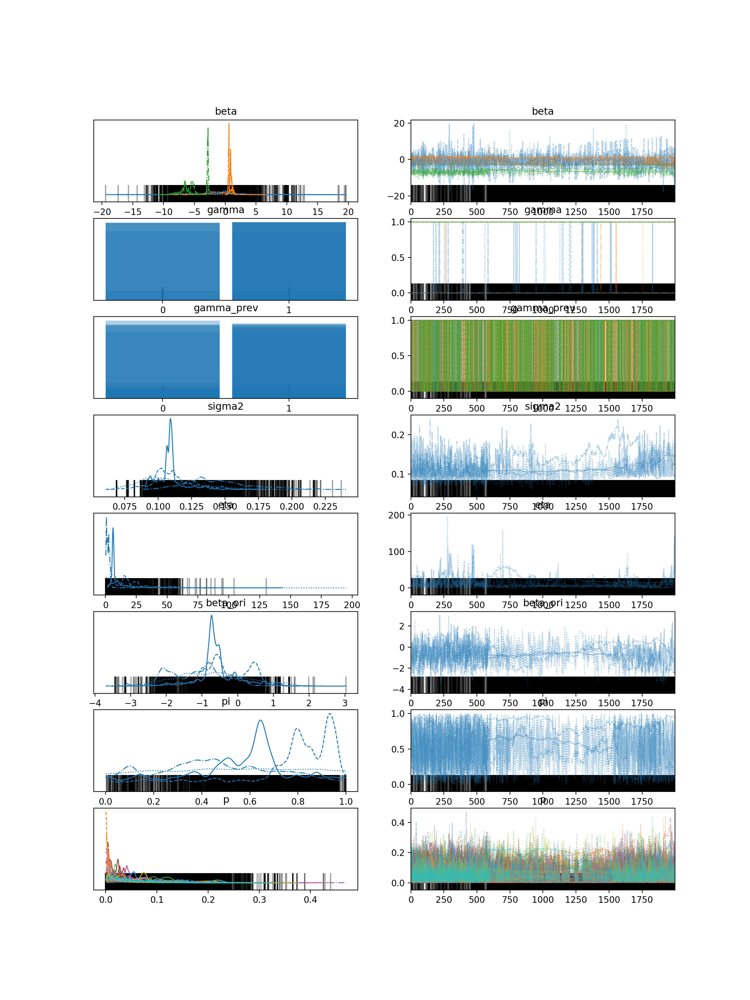

/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)


                 mean      sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
beta[0]        -1.060   3.332  -8.170    4.648      0.069    0.233    1236.0   
beta[1]         0.237   1.355  -2.904    1.524      0.471    0.346      11.0   
beta[2]        -5.420   1.901  -8.204   -2.644      0.814    0.610       7.0   
gamma[0]        0.036   0.187   0.000    0.000      0.024    0.017      62.0   
gamma[1]        0.720   0.449   0.000    1.000      0.211    0.160       5.0   
gamma[2]        1.000   0.000   1.000    1.000      0.000    0.000    8000.0   
gamma_prev[0]   0.114   0.318   0.000    1.000      0.022    0.015     219.0   
gamma_prev[1]   0.667   0.471   0.000    1.000      0.168    0.124       8.0   
gamma_prev[2]   0.894   0.307   0.000    1.000      0.004    0.003    6144.0   
sigma2          0.118   0.025   0.076    0.171      0.008    0.006       9.0   
eta            11.397  13.037   0.241   33.182      3.423    2.471       7.0   
beta_ori       -0.684   0.862  -2.421   

In [278]:

# Step 1: Generate simulated data
np.random.seed(42)
N = 2000  # Number of samples
D = 3  # Number of predictors


# Step 2: Define the PyMC model
with pm.Model() as model:
    # Priors
    # Beta for regression coefficients, grouped into classes
    #alpha = pm.HalfNormal("alpha", sigma=5.0)  # Dirichlet prior concentration parameter
    alpha=1
    p = pm.Dirichlet("p", a=pm.math.ones(20) * alpha, shape=20)  # Class probabilities
 #10 0 1 2 3 4 
    S = pm.Categorical("S", p=p, shape=3)# bp=nel shape  1 1 1  # Class assignment for predictors (0-9)
    #[1 3 5 7 9]
    eta = pm.InverseGamma("eta", alpha=2, beta=2)  # Variance for beta_m
    mu_0=pm.Normal("beta_ori",mu=0,sigma=1)
    beta_m = pm.Normal("beta_m", mu=mu_0, sigma=pm.math.sqrt(eta), shape=20)  # Regression coefficients for each class
    
    # Ensure S only indexes valid categories of beta_m
    beta = pm.Deterministic("beta", beta_m[S])  # Map beta based on S
    
    # Sparsity indicator gamma
    pi = pm.Beta("pi", alpha=1, beta=1)  # Probability of gamma=1
    gamma_prev = pm.Bernoulli("gamma_prev", p=0.5, shape=D)  # 初始值
    rho = 0.8  # 控制gamma的平稳性（越接近1越稳定）
    gamma = pm.Bernoulli("gamma", p=rho * gamma_prev + (1 - rho) * pi, shape=D)

    #gamma = pm.Bernoulli("gamma", p=pi, shape=D)

    # Noise variance (sigma^2)
    sigma2 = pm.InverseGamma("sigma2", alpha=2, beta=2)  # Prior for noise variance

    # Observed data likelihood
    mu = pm.math.dot(X_with_intercept, beta * gamma)  # Predicted mean
    y_obs = pm.Normal("y_obs", mu=mu, sigma=pm.math.sqrt(sigma2), observed=y)

    # Inference
    
    trace = pm.sample(N, tune=500, chains=4,step=pm.NUTS(target_accept=0.8), return_inferencedata=True, cores=1)


# Step 3: Analyze and visualize the results
az.plot_trace(trace, var_names=["beta", "gamma", "gamma_prev","sigma2", "eta", "beta_ori","pi", "p"])
plt.show()
summary=az.summary(trace, var_names=["beta", "gamma","gamma_prev", "sigma2", "eta","beta_ori", "pi", "p"])
print(summary)

/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/plots/backends/matplotlib/pairplot.py:233: UserWarning: rcParams['plot.max_subplots'] (40) is smaller than the number of resulting pair plots with these variables, generating only a 8x8 grid
  warnings.warn(


<IPython.core.display.Javascript object>


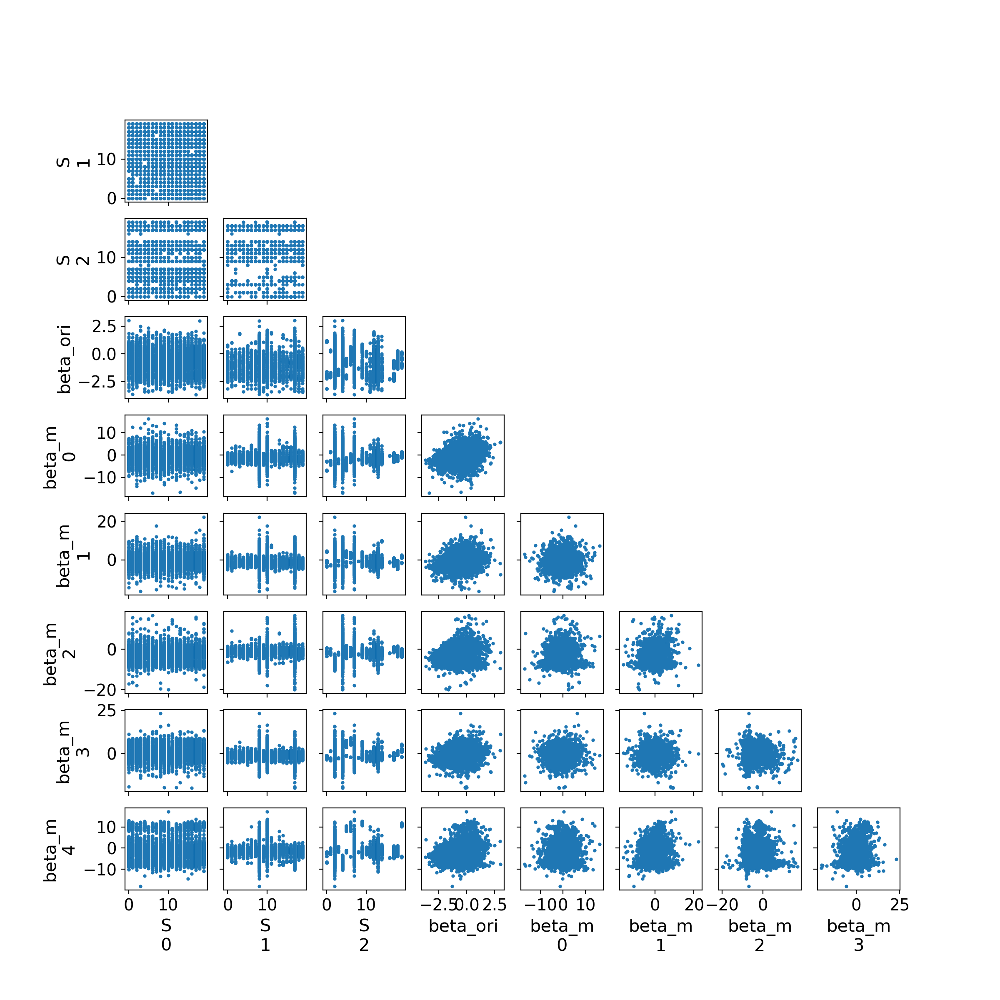

array([[<Axes: ylabel='S\n1'>, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
        <Axes: >, <Axes: >, <Axes: >],
       [<Axes: ylabel='S\n2'>, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
        <Axes: >, <Axes: >, <Axes: >],
       [<Axes: ylabel='beta_ori'>, <Axes: >, <Axes: >, <Axes: >,
        <Axes: >, <Axes: >, <Axes: >, <Axes: >],
       [<Axes: ylabel='beta_m\n0'>, <Axes: >, <Axes: >, <Axes: >,
        <Axes: >, <Axes: >, <Axes: >, <Axes: >],
       [<Axes: ylabel='beta_m\n1'>, <Axes: >, <Axes: >, <Axes: >,
        <Axes: >, <Axes: >, <Axes: >, <Axes: >],
       [<Axes: ylabel='beta_m\n2'>, <Axes: >, <Axes: >, <Axes: >,
        <Axes: >, <Axes: >, <Axes: >, <Axes: >],
       [<Axes: ylabel='beta_m\n3'>, <Axes: >, <Axes: >, <Axes: >,
        <Axes: >, <Axes: >, <Axes: >, <Axes: >],
       [<Axes: xlabel='S\n0', ylabel='beta_m\n4'>, <Axes: xlabel='S\n1'>,
        <Axes: xlabel='S\n2'>, <Axes: xlabel='beta_ori'>,
        <Axes: xlabel='beta_m\n0'>, <Axes: xlabel='beta_m\n1'>,
        <A

In [279]:

az.plot_pair(trace, figsize=(12, 12))

<IPython.core.display.Javascript object>


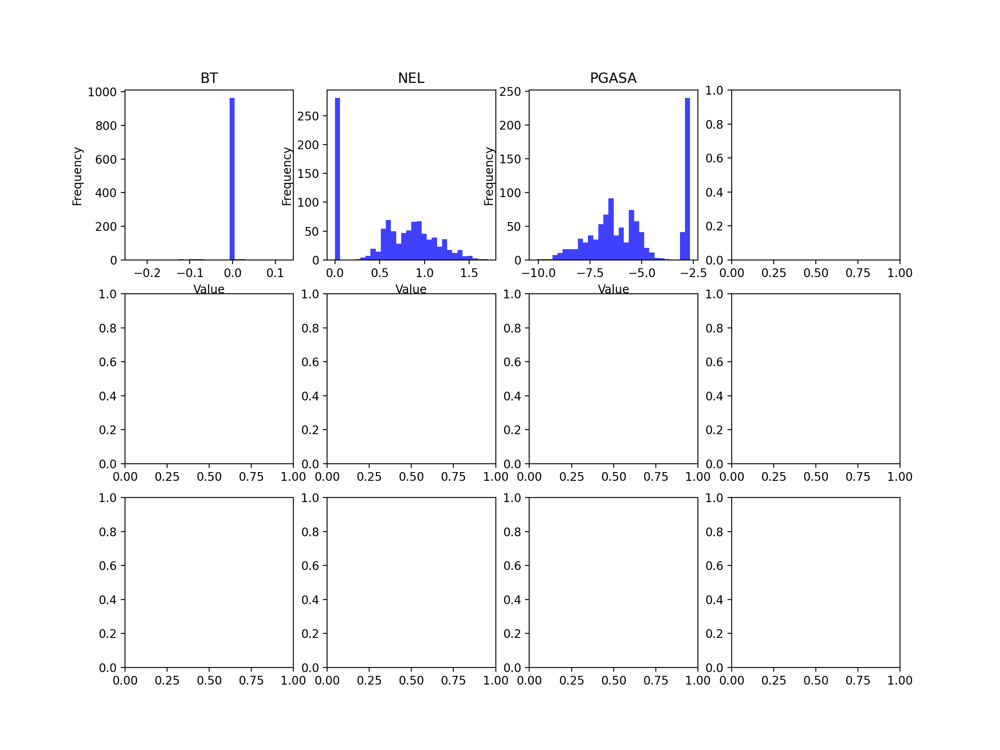

IndexError: index 3 is out of bounds for axis 1 with size 3

In [280]:
# 从后验中随机抽取 10 个样本
num_samples = 1000
posterior_indices = np.random.choice(
    trace.posterior["beta"].stack(samples=["chain", "draw"]).shape[1], 
    size=num_samples, 
    replace=False
)

# 定义新数据
 # 新数据 (10 个样本)

# 存储预测结果
beta_new_look = []
predictions = []
S_new = []
gamma_new=[]
for idx in posterior_indices:
    beta_sample = trace.posterior["beta"].stack(samples=["chain", "draw"]).values[:, idx]
    gamma_sample = trace.posterior["gamma"].stack(samples=["chain", "draw"]).values[:, idx]
    S_sample = trace.posterior["S"].stack(samples=["chain", "draw"]).values[:, idx]
    sigma_sample = np.sqrt(trace.posterior["sigma2"].stack(samples=["chain", "draw"]).values[idx])
    #gamma_binary = (gamma_post_mean > 0.5).astype(int)
    # 计算预测值
    mu_pred = X_with_intercept @ (beta_sample * gamma_sample)  # 预测均值
    y_pred = np.random.normal(mu_pred, sigma_sample, size=X_with_intercept.shape[0])  # 从预测分布采样
    S_new.append(gamma_sample*beta_sample)
    beta_new_look.append(S_sample)
    gamma_new.append(gamma_sample)
    predictions.append(y_pred)
S_new1 = np.array(S_new)
gamma_new = np.array(gamma_new)
fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(12, 9))
axes = axes.flatten()

for i in range(4):
    ax = axes[i]
    # 只考虑 gamma 为 1 的情况
    #filtered_beta = S_new1[:, i][gamma_new[:, i] == 1]
    filtered_beta = S_new1[:, i]
    ax.hist(filtered_beta, bins=30, alpha=0.75, color='blue')
    ax.set_title(f'{X_with_intercept.columns[i]}')
    ax.set_xlabel('Value')
    ax.set_ylabel('Frequency')

plt.tight_layout()
plt.savefig('distribution.png', format='png', dpi=300, transparent=True)
plt.show()
S_mean_new = np.array(S_new).mean(axis=0)
beta_new_look_new = np.array(beta_new_look).mean(axis=0)
gamma_mean = np.array(gamma_new).mean(axis=0) 
gamma_binary = (gamma_mean > 0.5).astype(int)
print(gamma_mean)

predictions = np.array(predictions).T  
pred_mean = predictions.mean(axis=1) 
print(S_mean_new)
print(beta_new_look_new)
SS_res = np.sum((pred_mean - y) ** 2)
SS_tot = np.sum((y - np.mean(y)) ** 2)
R_squared = 1 - (SS_res / SS_tot)
print(f"1000 samples' R² values=: {R_squared:.4f}")